## Solution of Problem 22: DCGAN for FashionMNIST

In [1]:
#library imports
import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid

import torch.nn as nn
from torch import optim
from tqdm import tqdm

import matplotlib.pyplot as plt

import numpy as np

## Fix size of images to be generated

In [2]:
# size per dimension of the images to be generated
IMAGE_SIZE = 64

## FashionMNIST data import

In [3]:
# the loaded image data are resized to image size (IMAGE_SIZE x IMAGE_SIZE) and the gray values are normalized to [0,1]
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.ToTensor(),
])

# read FashionMNIST training dataset (we don't necessarily need the test dataset)
train_dataset = datasets.FashionMNIST(
    root="data",
    train=True,
    download=True,
    transform=transform
)

## Choose either the whole dataset or a single class for training

In [4]:
# choose one of the following label indices (10 = whole dataset)
# 0 : 'T-shirt/top', 1 : 'Trouser', 2 : 'Pullover', 3 : 'Dress', 4 : 'Coat',
# 5 : 'Sandal',  6 : 'Shirt', 7 : 'Sneaker', 8 : 'Bag',  9 : 'Ankle boot'
# 10: ALL
LABEL_IDX = 7

if LABEL_IDX != 10:
    train_indices = [i for i, (e, c) in enumerate(train_dataset) if c in [LABEL_IDX]]
    train_subset = torch.utils.data.Subset(train_dataset, train_indices)
else:
    train_subset = train_dataset

print('Size of considered training dataset:',len(train_subset))

Size of considered training dataset: 6000


## Choose batch size

In [5]:
BATCH_SIZE = 50

train_dataloader = DataLoader(train_subset,batch_size=BATCH_SIZE,shuffle=True)
print(len(train_dataloader.sampler))

6000


## Illustration of batch of sample images from considered training dataset

120
50


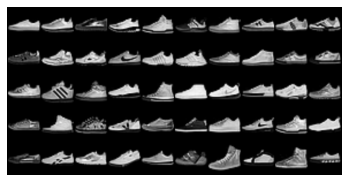

In [6]:
data_batch, labels_batch = next(iter(train_dataloader))
print(len(train_dataloader))
print(len(data_batch))
grid_img = make_grid(data_batch, nrow=10)
plt.imshow(grid_img.permute(1,2,0))
plt.axis('off')
plt.show()

## Choose device (CPU/CUDA) for data processing

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Specificaton of Generator / Discriminator according to problem description

In [8]:
class Generator(nn.Module):
    def __init__(self, latent_dim,channel_num):
        super(Generator,self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(latent_dim,    channel_num,     4, 1, 0),
            nn.BatchNorm2d(channel_num),
            nn.ReLU(),
            nn.ConvTranspose2d(channel_num,   channel_num//2,  4, 2, 1),
            nn.BatchNorm2d(channel_num//2),
            nn.ReLU(),
            nn.ConvTranspose2d(channel_num//2, channel_num//4, 4, 2, 1),
            nn.BatchNorm2d(channel_num//4),
            nn.ReLU(),
            nn.ConvTranspose2d(channel_num//4, channel_num//8, 4, 2, 1),
            nn.BatchNorm2d(channel_num//8),
            nn.ReLU(),
            nn.ConvTranspose2d(channel_num//8, 1,              4, 2, 1),
            nn.Tanh())

    def forward(self,x):
        return self.net(x)

class Discriminator(nn.Module):
    def __init__(self, channel_num):
        super(Discriminator,self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1,              channel_num//8, 4, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(channel_num//8, channel_num//4, 4, 2, 1),
            nn.BatchNorm2d(channel_num//4),
            nn.LeakyReLU(0.2),
            nn.Conv2d(channel_num//4, channel_num//2, 4, 2, 1),
            nn.BatchNorm2d(channel_num//2),
            nn.LeakyReLU(0.2),
            nn.Conv2d(channel_num//2, channel_num,    4, 2, 1),
            nn.BatchNorm2d(channel_num),
            nn.LeakyReLU(0.2),
            nn.Conv2d(channel_num,    1,              4, 1, 0),
            nn.Sigmoid())
    def forward(self, input):
        return self.net(input)

## Generator / Discriminator definition

In [9]:
# dimension of latent space
LATENT_DIM = 100
# number of channels in first convolutional layer of generator
CHANNEL_NUM = 512

modelGen = Generator(LATENT_DIM, CHANNEL_NUM).to(device)    
modelDis = Discriminator(CHANNEL_NUM).to(device)   

print(modelGen)
print(modelDis)

Generator(
  (net): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): Tanh()
  )
)
Discriminator(
  (net): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))

## Weight initialization

In [10]:
# use weight initialization as suggested in the DCGAN paper: N(0,0.02)
# initialization in batch norm layer: N(1,0.02) -> see meaning of learnable parameters in batch norm layer
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data,0.0,0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data,1.0,0.02)
        nn.init.constant_(m.bias.data,0)
        
modelDis.apply(weights_init);
modelGen.apply(weights_init);

## Generate batch of images with untrained generator for illustration

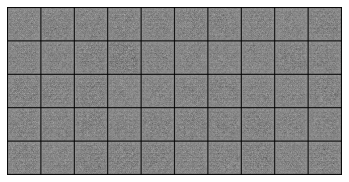

In [11]:
# sample BATCH_SIZE vectors of dimension LATENT_DIM from standard normal distribution
z = torch.randn((BATCH_SIZE, LATENT_DIM)).view(-1,LATENT_DIM,1,1).to(device)

# generate batch of images with generator, renormalize output from range [-1,1] to [0,1]
gen_output_batch = (modelGen(z) + 1) / 2

gen_images_batch = gen_output_batch.to('cpu').detach()
grid_img = make_grid(gen_images_batch, nrow=10)
plt.imshow(grid_img.permute(1,2,0))
plt.axis('off')
plt.show()

## Count number of trainable parameters

In [12]:
#count and print number of parameters: total/trainable 
num_params_modelGen = sum(param.numel() for param in modelGen.parameters())
num_train_params_modelGen = sum(p.numel() for p in modelGen.parameters() if p.requires_grad)

num_params_modelDis = sum(param.numel() for param in modelDis.parameters())
num_train_params_modelDis = sum(p.numel() for p in modelDis.parameters() if p.requires_grad)

print('Generator:')
print('Number parameters:', num_params_modelGen)
print('Trainable parameters:', num_train_params_modelGen,'\n')
print('Discriminator:')
print('Number parameters:', num_params_modelDis)
print('Trainable parameters:', num_train_params_modelDis,'\n')
print('Total:')
print('Number parameters:', num_params_modelGen+num_params_modelDis)
print('Trainable parameters:', num_train_params_modelGen+num_train_params_modelDis)


Generator:
Number parameters: 3575617
Trainable parameters: 3575617 

Discriminator:
Number parameters: 2764481
Trainable parameters: 2764481 

Total:
Number parameters: 6340098
Trainable parameters: 6340098


## Training algorithm

In [13]:
# binary entropy loss: used in the right way it provides us both: log(D(x)) and log(1−D(G(z)))
criterion = nn.BCELoss()

# optimizers as suggested in DCGAN paper with similar parameters

# adam optimizer for generator
optimizerGen = optim.Adam(modelGen.parameters(),
                       lr = 0.0002, #0.0001
                       betas=(0.5,0.999))

# adam optimizer for discriminator
optimizerDis = optim.Adam(modelDis.parameters(),
                      lr=0.0001, #0.0001
                      betas=(0.5,0.999))

# these probability labels are used during training to label training images and generated images 
# as 'real' and 'fake'; allows to use the BCELoss() function appropriately
real_labels = torch.full((BATCH_SIZE,),
                       1.,
                       dtype=torch.float,
                       device=device)

fake_labels = torch.full((BATCH_SIZE,),
                        0.,
                        dtype=torch.float,
                        device=device)

# sample BATCH_SIZE vectors of dimension LATENT_DIM from standard normal distribution
# to test and visualize image generation during training
z_val = torch.randn((BATCH_SIZE, LATENT_DIM)).view(-1,LATENT_DIM,1,1).to(device)

Epoch 1


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.58it/s, Generator loss=1.20756, Discriminator loss=1.04606]


Avg batch loss for epoch 1: Generator: 5.78950 Discriminator: 0.75580 (Real: 0.38325 / Fake: 0.37255)


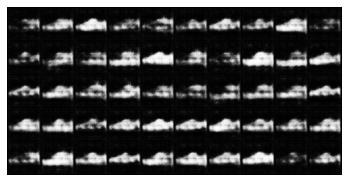

Epoch 2


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.72it/s, Generator loss=1.27374, Discriminator loss=1.45858]


Avg batch loss for epoch 2: Generator: 2.58151 Discriminator: 0.96081 (Real: 0.50148 / Fake: 0.45932)


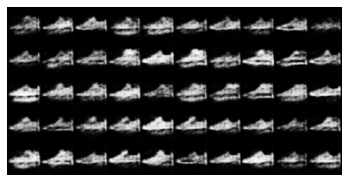

Epoch 3


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.81it/s, Generator loss=1.75520, Discriminator loss=1.23879]


Avg batch loss for epoch 3: Generator: 1.88558 Discriminator: 1.13755 (Real: 0.57473 / Fake: 0.56282)


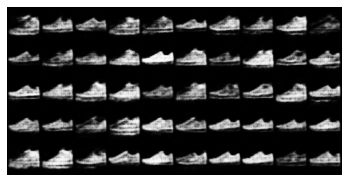

Epoch 4


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.91it/s, Generator loss=1.22441, Discriminator loss=1.22281]


Avg batch loss for epoch 4: Generator: 1.53369 Discriminator: 1.22805 (Real: 0.62715 / Fake: 0.60090)


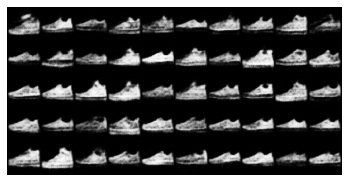

Epoch 5


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.87it/s, Generator loss=2.35553, Discriminator loss=1.19978]


Avg batch loss for epoch 5: Generator: 1.45125 Discriminator: 1.25535 (Real: 0.63554 / Fake: 0.61981)


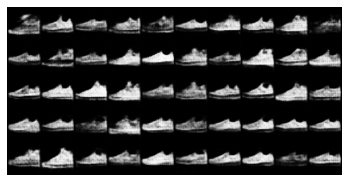

Epoch 6


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.02it/s, Generator loss=0.88187, Discriminator loss=1.19414]

Avg batch loss for epoch 6: Generator: 1.41778 Discriminator: 1.26119 (Real: 0.63946 / Fake: 0.62174)


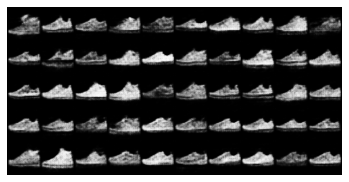

Epoch 7


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.85it/s, Generator loss=1.58355, Discriminator loss=1.08327]


Avg batch loss for epoch 7: Generator: 1.52479 Discriminator: 1.22204 (Real: 0.61583 / Fake: 0.60620)


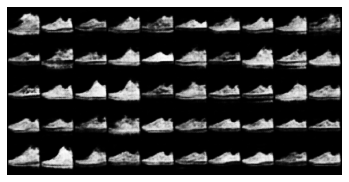

Epoch 8


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.46it/s, Generator loss=2.63221, Discriminator loss=1.28187]


Avg batch loss for epoch 8: Generator: 1.55895 Discriminator: 1.16724 (Real: 0.58857 / Fake: 0.57867)


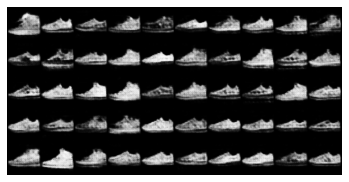

Epoch 9


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.17it/s, Generator loss=1.96251, Discriminator loss=1.12148]


Avg batch loss for epoch 9: Generator: 1.65058 Discriminator: 1.17638 (Real: 0.59338 / Fake: 0.58300)


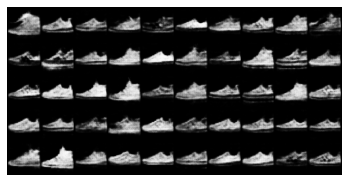

Epoch 10


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.31it/s, Generator loss=0.90981, Discriminator loss=1.05468]


Avg batch loss for epoch 10: Generator: 1.67603 Discriminator: 1.11468 (Real: 0.56698 / Fake: 0.54770)


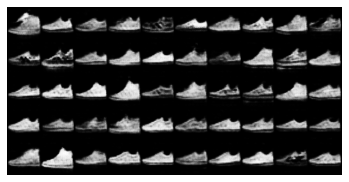

Epoch 11


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.93it/s, Generator loss=1.36533, Discriminator loss=1.00496]


Avg batch loss for epoch 11: Generator: 1.70568 Discriminator: 1.10651 (Real: 0.55614 / Fake: 0.55037)


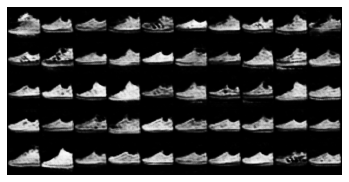

Epoch 12


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.16it/s, Generator loss=0.74164, Discriminator loss=1.20815]


Avg batch loss for epoch 12: Generator: 1.83122 Discriminator: 1.06539 (Real: 0.54143 / Fake: 0.52396)


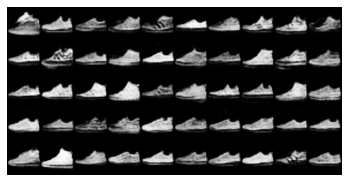

Epoch 13


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.04it/s, Generator loss=2.35425, Discriminator loss=1.01345]

Avg batch loss for epoch 13: Generator: 1.82563 Discriminator: 1.01336 (Real: 0.51064 / Fake: 0.50272)


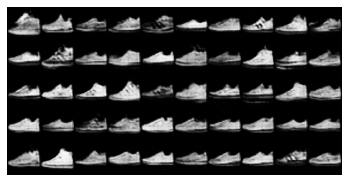

Epoch 14


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.96it/s, Generator loss=0.97026, Discriminator loss=1.15722]


Avg batch loss for epoch 14: Generator: 1.88628 Discriminator: 1.00672 (Real: 0.51223 / Fake: 0.49449)


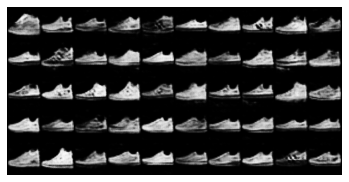

Epoch 15


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.09it/s, Generator loss=2.01538, Discriminator loss=0.72700]


Avg batch loss for epoch 15: Generator: 2.03547 Discriminator: 0.94531 (Real: 0.47740 / Fake: 0.46791)


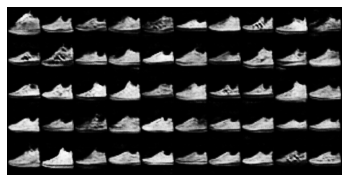

Epoch 16


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.98it/s, Generator loss=1.80607, Discriminator loss=0.78357]


Avg batch loss for epoch 16: Generator: 2.14630 Discriminator: 0.95427 (Real: 0.48679 / Fake: 0.46749)


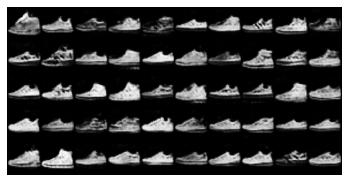

Epoch 17


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.05it/s, Generator loss=1.73960, Discriminator loss=0.87274]


Avg batch loss for epoch 17: Generator: 2.12951 Discriminator: 0.91736 (Real: 0.46527 / Fake: 0.45209)


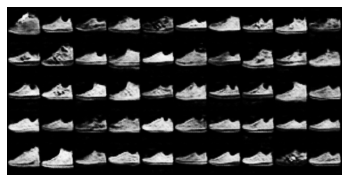

Epoch 18


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.95it/s, Generator loss=0.98555, Discriminator loss=1.18068]


Avg batch loss for epoch 18: Generator: 2.12087 Discriminator: 0.91784 (Real: 0.46580 / Fake: 0.45204)


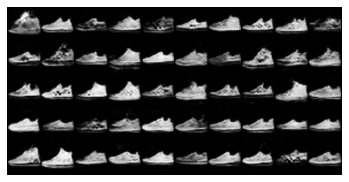

Epoch 19


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.99it/s, Generator loss=2.67208, Discriminator loss=0.74901]


Avg batch loss for epoch 19: Generator: 2.23186 Discriminator: 0.87478 (Real: 0.44343 / Fake: 0.43135)


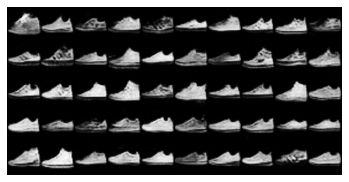

Epoch 20


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.13it/s, Generator loss=2.48533, Discriminator loss=0.91045]


Avg batch loss for epoch 20: Generator: 2.32827 Discriminator: 0.88779 (Real: 0.45060 / Fake: 0.43719)


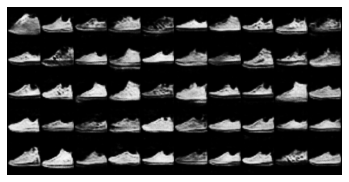

Epoch 21


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.99it/s, Generator loss=1.84476, Discriminator loss=0.75156]


Avg batch loss for epoch 21: Generator: 2.27093 Discriminator: 0.82032 (Real: 0.41608 / Fake: 0.40424)


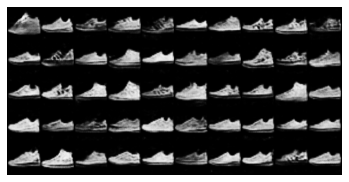

Epoch 22


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.10it/s, Generator loss=1.89302, Discriminator loss=0.76333]


Avg batch loss for epoch 22: Generator: 2.37496 Discriminator: 0.76193 (Real: 0.38693 / Fake: 0.37500)


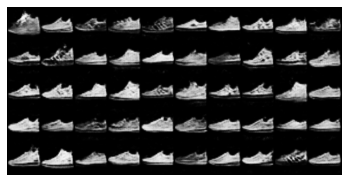

Epoch 23


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.76it/s, Generator loss=2.70704, Discriminator loss=0.59834]


Avg batch loss for epoch 23: Generator: 2.47304 Discriminator: 0.74317 (Real: 0.37550 / Fake: 0.36767)


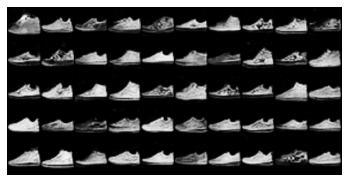

Epoch 24


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.39it/s, Generator loss=3.65486, Discriminator loss=0.92209]


Avg batch loss for epoch 24: Generator: 2.56462 Discriminator: 0.75009 (Real: 0.37967 / Fake: 0.37042)


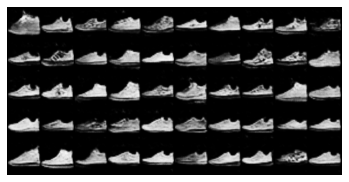

Epoch 25


Training...: 100%|██████████| 120/120 [00:07<00:00, 17.13it/s, Generator loss=2.04939, Discriminator loss=0.51983]


Avg batch loss for epoch 25: Generator: 2.59359 Discriminator: 0.72698 (Real: 0.36951 / Fake: 0.35746)


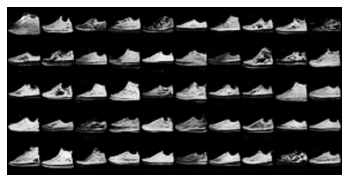

Epoch 26


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.91it/s, Generator loss=4.81703, Discriminator loss=0.92862]


Avg batch loss for epoch 26: Generator: 2.60345 Discriminator: 0.73306 (Real: 0.37018 / Fake: 0.36288)


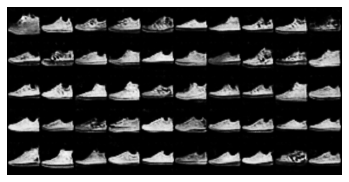

Epoch 27


Training...: 100%|██████████| 120/120 [00:06<00:00, 17.18it/s, Generator loss=2.28271, Discriminator loss=0.51615]


Avg batch loss for epoch 27: Generator: 2.73880 Discriminator: 0.66730 (Real: 0.34594 / Fake: 0.32136)


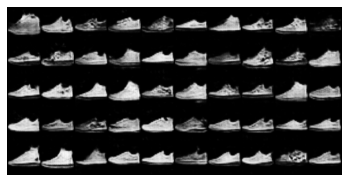

Epoch 28


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.64it/s, Generator loss=1.97108, Discriminator loss=0.54230]


Avg batch loss for epoch 28: Generator: 2.73347 Discriminator: 0.70313 (Real: 0.35863 / Fake: 0.34450)


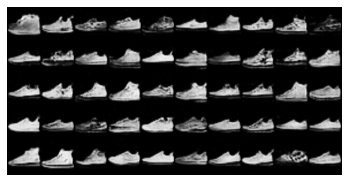

Epoch 29


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.87it/s, Generator loss=3.47948, Discriminator loss=0.74819]


Avg batch loss for epoch 29: Generator: 2.78053 Discriminator: 0.63734 (Real: 0.32573 / Fake: 0.31161)


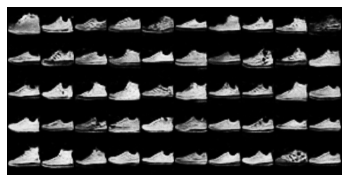

Epoch 30


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.97it/s, Generator loss=1.28931, Discriminator loss=0.95135]


Avg batch loss for epoch 30: Generator: 2.83998 Discriminator: 0.63513 (Real: 0.32209 / Fake: 0.31304)


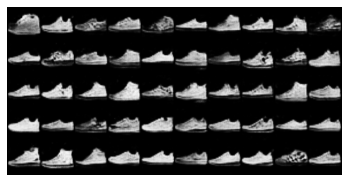

Epoch 31


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.41it/s, Generator loss=1.12626, Discriminator loss=1.24222]


Avg batch loss for epoch 31: Generator: 2.87641 Discriminator: 0.63838 (Real: 0.32329 / Fake: 0.31509)


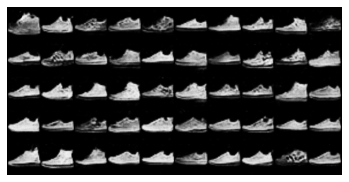

Epoch 32


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.88it/s, Generator loss=3.34227, Discriminator loss=0.63023]


Avg batch loss for epoch 32: Generator: 2.96268 Discriminator: 0.52762 (Real: 0.26307 / Fake: 0.26455)


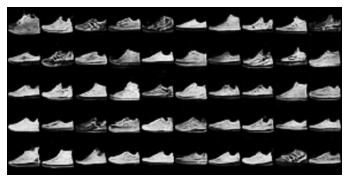

Epoch 33


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.62it/s, Generator loss=3.09587, Discriminator loss=0.32454]


Avg batch loss for epoch 33: Generator: 3.08313 Discriminator: 0.66878 (Real: 0.34065 / Fake: 0.32813)


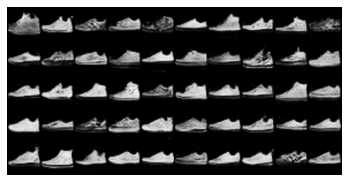

Epoch 34


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.86it/s, Generator loss=2.21333, Discriminator loss=0.60198]


Avg batch loss for epoch 34: Generator: 3.16066 Discriminator: 0.53993 (Real: 0.27312 / Fake: 0.26682)


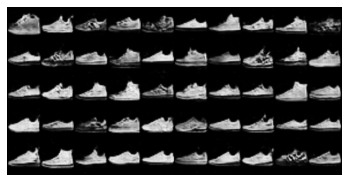

Epoch 35


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.91it/s, Generator loss=3.13871, Discriminator loss=0.54208]


Avg batch loss for epoch 35: Generator: 3.09099 Discriminator: 0.49374 (Real: 0.24902 / Fake: 0.24472)


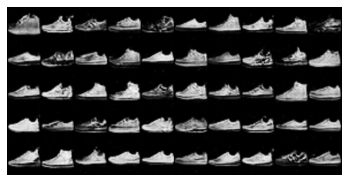

Epoch 36


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.54it/s, Generator loss=1.09273, Discriminator loss=1.44551]


Avg batch loss for epoch 36: Generator: 3.24228 Discriminator: 0.40953 (Real: 0.20982 / Fake: 0.19971)


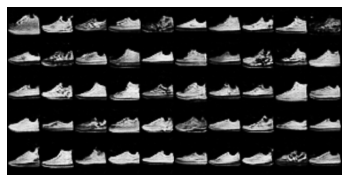

Epoch 37


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.78it/s, Generator loss=3.76017, Discriminator loss=0.35781]


Avg batch loss for epoch 37: Generator: 3.21799 Discriminator: 0.56840 (Real: 0.28549 / Fake: 0.28291)


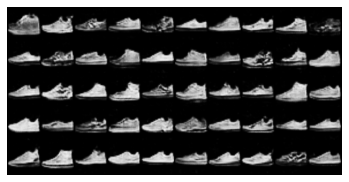

Epoch 38


Training...: 100%|██████████| 120/120 [00:06<00:00, 17.15it/s, Generator loss=2.54295, Discriminator loss=0.30380]


Avg batch loss for epoch 38: Generator: 3.19739 Discriminator: 0.56292 (Real: 0.30452 / Fake: 0.25839)


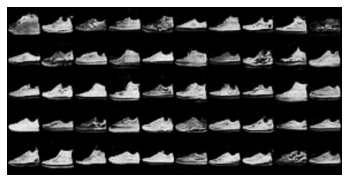

Epoch 39


Training...: 100%|██████████| 120/120 [00:07<00:00, 17.10it/s, Generator loss=3.52389, Discriminator loss=0.31621]


Avg batch loss for epoch 39: Generator: 3.19876 Discriminator: 0.56786 (Real: 0.28788 / Fake: 0.27998)


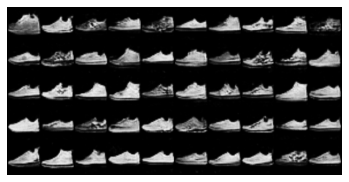

Epoch 40


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.91it/s, Generator loss=3.08589, Discriminator loss=0.15685]


Avg batch loss for epoch 40: Generator: 3.21542 Discriminator: 0.44238 (Real: 0.22099 / Fake: 0.22139)


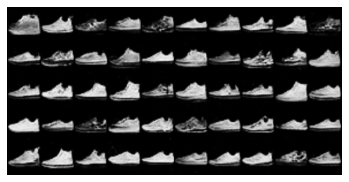

Epoch 41


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.72it/s, Generator loss=4.04152, Discriminator loss=0.44924]


Avg batch loss for epoch 41: Generator: 3.25085 Discriminator: 0.50361 (Real: 0.25735 / Fake: 0.24626)


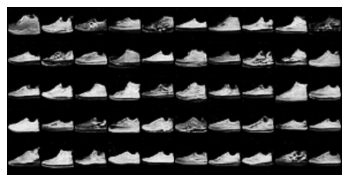

Epoch 42


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.50it/s, Generator loss=4.35302, Discriminator loss=0.57104]


Avg batch loss for epoch 42: Generator: 3.41466 Discriminator: 0.55262 (Real: 0.28271 / Fake: 0.26991)


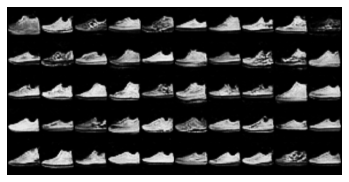

Epoch 43


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.31it/s, Generator loss=3.01970, Discriminator loss=0.22633]


Avg batch loss for epoch 43: Generator: 3.38834 Discriminator: 0.22554 (Real: 0.11451 / Fake: 0.11104)


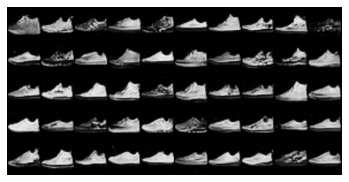

Epoch 44


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.01it/s, Generator loss=3.61039, Discriminator loss=0.25704]


Avg batch loss for epoch 44: Generator: 3.34472 Discriminator: 0.65675 (Real: 0.32574 / Fake: 0.33101)


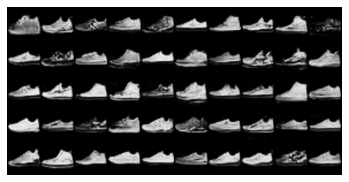

Epoch 45


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.02it/s, Generator loss=3.31560, Discriminator loss=0.11273]


Avg batch loss for epoch 45: Generator: 3.58196 Discriminator: 0.16360 (Real: 0.08179 / Fake: 0.08181)


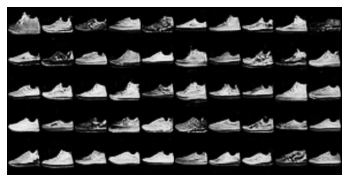

Epoch 46


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.42it/s, Generator loss=3.84087, Discriminator loss=1.65429] 


Avg batch loss for epoch 46: Generator: 3.59577 Discriminator: 0.50013 (Real: 0.26449 / Fake: 0.23564)


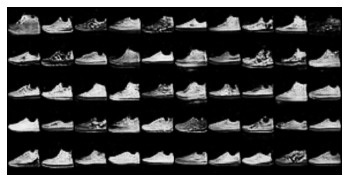

Epoch 47


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.84it/s, Generator loss=5.05744, Discriminator loss=0.70029]


Avg batch loss for epoch 47: Generator: 3.23448 Discriminator: 0.69311 (Real: 0.35796 / Fake: 0.33515)


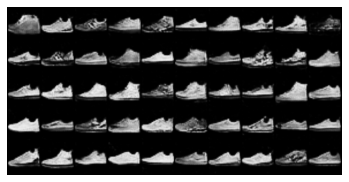

Epoch 48


Training...: 100%|██████████| 120/120 [00:03<00:00, 31.62it/s, Generator loss=2.97876, Discriminator loss=0.37511]


Avg batch loss for epoch 48: Generator: 3.00782 Discriminator: 0.69567 (Real: 0.34905 / Fake: 0.34662)


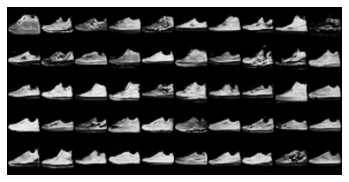

Epoch 49


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.20it/s, Generator loss=3.55970, Discriminator loss=0.24146]


Avg batch loss for epoch 49: Generator: 3.37380 Discriminator: 0.32170 (Real: 0.16468 / Fake: 0.15702)


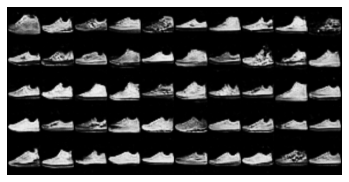

Epoch 50


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.43it/s, Generator loss=2.83754, Discriminator loss=0.26627]


Avg batch loss for epoch 50: Generator: 3.61976 Discriminator: 0.36055 (Real: 0.18190 / Fake: 0.17865)


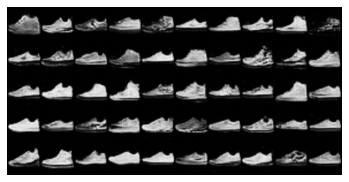

Epoch 51


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.55it/s, Generator loss=4.10242, Discriminator loss=0.32826]


Avg batch loss for epoch 51: Generator: 3.21652 Discriminator: 0.56976 (Real: 0.28584 / Fake: 0.28392)


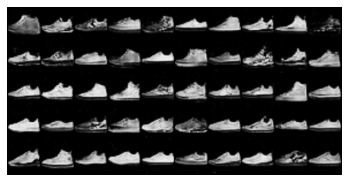

Epoch 52


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.62it/s, Generator loss=3.23638, Discriminator loss=0.12571]


Avg batch loss for epoch 52: Generator: 3.67899 Discriminator: 0.20021 (Real: 0.10057 / Fake: 0.09964)


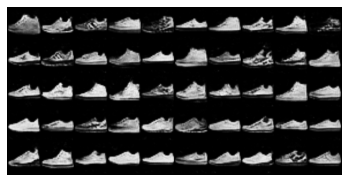

Epoch 53


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.21it/s, Generator loss=1.26147, Discriminator loss=1.29061]


Avg batch loss for epoch 53: Generator: 3.24938 Discriminator: 0.76961 (Real: 0.40463 / Fake: 0.36497)


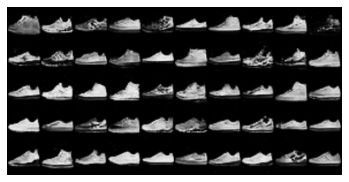

Epoch 54


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.87it/s, Generator loss=4.32105, Discriminator loss=0.20526]


Avg batch loss for epoch 54: Generator: 3.62226 Discriminator: 0.27839 (Real: 0.13635 / Fake: 0.14204)


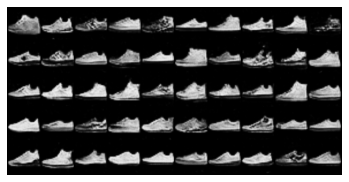

Epoch 55


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.26it/s, Generator loss=8.52346, Discriminator loss=0.55688]


Avg batch loss for epoch 55: Generator: 3.95339 Discriminator: 0.13180 (Real: 0.06633 / Fake: 0.06546)


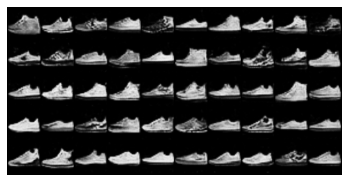

Epoch 56


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.79it/s, Generator loss=0.03603, Discriminator loss=3.07486]


Avg batch loss for epoch 56: Generator: 3.33232 Discriminator: 0.53309 (Real: 0.29024 / Fake: 0.24285)


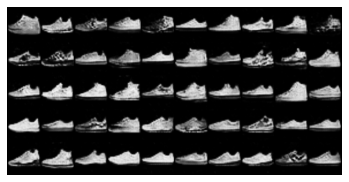

Epoch 57


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.46it/s, Generator loss=1.44726, Discriminator loss=1.19053]


Avg batch loss for epoch 57: Generator: 3.18452 Discriminator: 0.79688 (Real: 0.39630 / Fake: 0.40059)


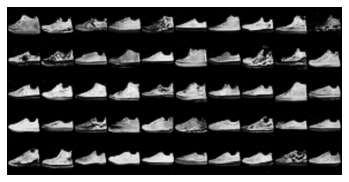

Epoch 58


Training...: 100%|██████████| 120/120 [00:03<00:00, 31.38it/s, Generator loss=4.02648, Discriminator loss=0.13147]


Avg batch loss for epoch 58: Generator: 3.71178 Discriminator: 0.31347 (Real: 0.15446 / Fake: 0.15902)


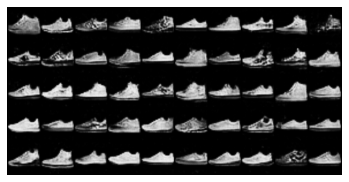

Epoch 59


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.61it/s, Generator loss=4.75611, Discriminator loss=0.08865]


Avg batch loss for epoch 59: Generator: 4.00121 Discriminator: 0.09521 (Real: 0.04778 / Fake: 0.04743)


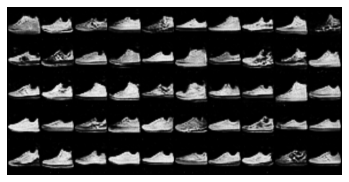

Epoch 60


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.28it/s, Generator loss=2.18378, Discriminator loss=0.79971]


Avg batch loss for epoch 60: Generator: 4.21240 Discriminator: 0.09191 (Real: 0.04841 / Fake: 0.04350)


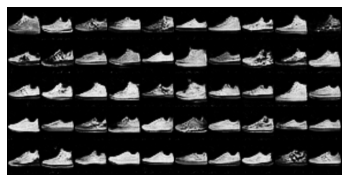

Epoch 61


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.53it/s, Generator loss=4.27434, Discriminator loss=0.17540]


Avg batch loss for epoch 61: Generator: 3.47734 Discriminator: 0.64299 (Real: 0.33505 / Fake: 0.30794)


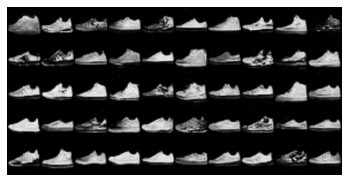

Epoch 62


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.38it/s, Generator loss=1.57150, Discriminator loss=1.20383]


Avg batch loss for epoch 62: Generator: 4.10567 Discriminator: 0.21171 (Real: 0.12447 / Fake: 0.08724)


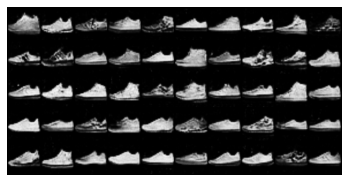

Epoch 63


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.72it/s, Generator loss=4.03563, Discriminator loss=0.45683]


Avg batch loss for epoch 63: Generator: 3.00632 Discriminator: 0.77606 (Real: 0.39133 / Fake: 0.38472)


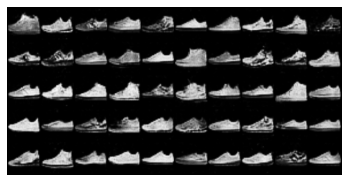

Epoch 64


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.96it/s, Generator loss=3.94122, Discriminator loss=4.88641]


Avg batch loss for epoch 64: Generator: 3.86231 Discriminator: 0.29983 (Real: 0.14733 / Fake: 0.15250)


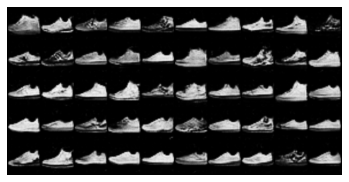

Epoch 65


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.33it/s, Generator loss=3.38229, Discriminator loss=0.08997]


Avg batch loss for epoch 65: Generator: 3.48371 Discriminator: 0.40337 (Real: 0.21073 / Fake: 0.19263)


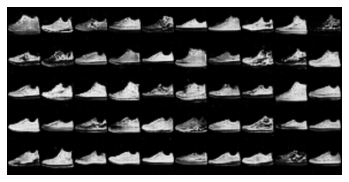

Epoch 66


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.76it/s, Generator loss=0.87163, Discriminator loss=1.53871]


Avg batch loss for epoch 66: Generator: 4.12169 Discriminator: 0.24189 (Real: 0.12083 / Fake: 0.12106)


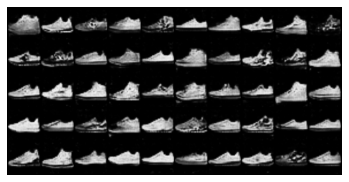

Epoch 67


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.50it/s, Generator loss=2.33385, Discriminator loss=0.43064]


Avg batch loss for epoch 67: Generator: 3.21394 Discriminator: 0.67745 (Real: 0.34096 / Fake: 0.33649)


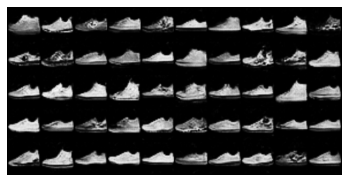

Epoch 68


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.98it/s, Generator loss=4.18002, Discriminator loss=0.13424]


Avg batch loss for epoch 68: Generator: 3.64447 Discriminator: 0.39713 (Real: 0.20294 / Fake: 0.19419)


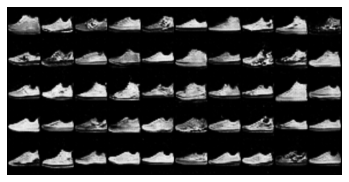

Epoch 69


Training...: 100%|██████████| 120/120 [00:03<00:00, 31.99it/s, Generator loss=4.26507, Discriminator loss=0.08225]


Avg batch loss for epoch 69: Generator: 4.14958 Discriminator: 0.10089 (Real: 0.05046 / Fake: 0.05043)


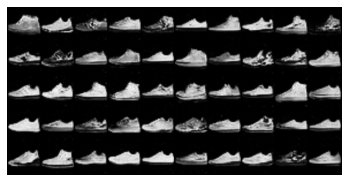

Epoch 70


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.33it/s, Generator loss=0.92969, Discriminator loss=0.88364]


Avg batch loss for epoch 70: Generator: 3.62833 Discriminator: 0.50924 (Real: 0.26981 / Fake: 0.23943)


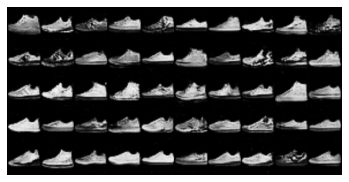

Epoch 71


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.63it/s, Generator loss=3.96260, Discriminator loss=0.18556]


Avg batch loss for epoch 71: Generator: 3.74473 Discriminator: 0.30536 (Real: 0.14987 / Fake: 0.15549)


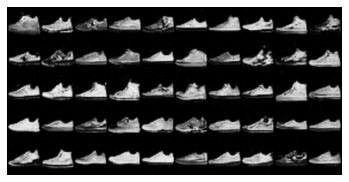

Epoch 72


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.69it/s, Generator loss=4.23870, Discriminator loss=0.44902]


Avg batch loss for epoch 72: Generator: 3.48403 Discriminator: 0.63780 (Real: 0.33534 / Fake: 0.30246)


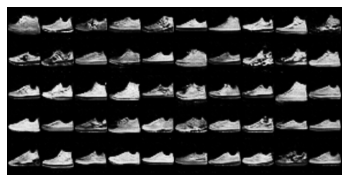

Epoch 73


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.94it/s, Generator loss=3.80223, Discriminator loss=0.09862]


Avg batch loss for epoch 73: Generator: 4.19416 Discriminator: 0.10176 (Real: 0.05109 / Fake: 0.05067)


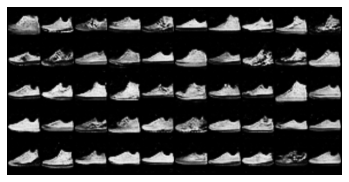

Epoch 74


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.72it/s, Generator loss=4.23590, Discriminator loss=0.09295]


Avg batch loss for epoch 74: Generator: 3.67505 Discriminator: 0.41985 (Real: 0.21160 / Fake: 0.20825)


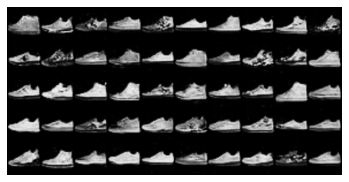

Epoch 75


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.14it/s, Generator loss=5.10588, Discriminator loss=0.05996]


Avg batch loss for epoch 75: Generator: 4.44905 Discriminator: 0.06976 (Real: 0.03470 / Fake: 0.03506)


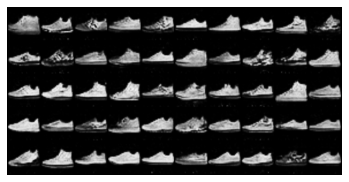

Epoch 76


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.90it/s, Generator loss=4.54985, Discriminator loss=0.04998]


Avg batch loss for epoch 76: Generator: 4.65333 Discriminator: 0.05621 (Real: 0.02813 / Fake: 0.02809)


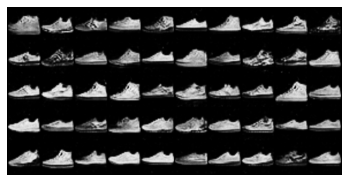

Epoch 77


Training...: 100%|██████████| 120/120 [00:03<00:00, 31.93it/s, Generator loss=3.96389, Discriminator loss=0.05790]


Avg batch loss for epoch 77: Generator: 4.92400 Discriminator: 0.04561 (Real: 0.02273 / Fake: 0.02288)


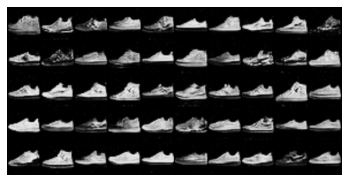

Epoch 78


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.26it/s, Generator loss=2.38573, Discriminator loss=0.52079]


Avg batch loss for epoch 78: Generator: 4.23259 Discriminator: 0.41321 (Real: 0.17537 / Fake: 0.23784)


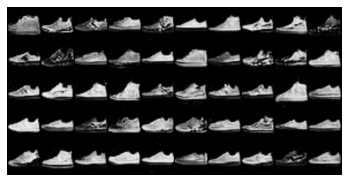

Epoch 79


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.97it/s, Generator loss=3.97338, Discriminator loss=0.20464]


Avg batch loss for epoch 79: Generator: 3.39779 Discriminator: 0.68458 (Real: 0.34393 / Fake: 0.34065)


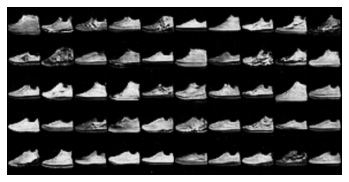

Epoch 80


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.89it/s, Generator loss=2.48222, Discriminator loss=0.45339]


Avg batch loss for epoch 80: Generator: 3.64698 Discriminator: 0.50284 (Real: 0.25670 / Fake: 0.24613)


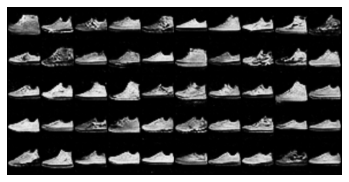

Epoch 81


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.96it/s, Generator loss=4.39437, Discriminator loss=0.11220]


Avg batch loss for epoch 81: Generator: 3.76753 Discriminator: 0.47472 (Real: 0.23705 / Fake: 0.23766)


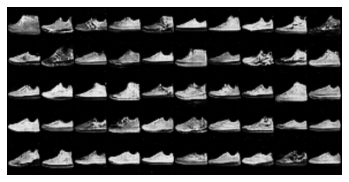

Epoch 82


Training...: 100%|██████████| 120/120 [00:03<00:00, 35.08it/s, Generator loss=1.64798, Discriminator loss=0.53619]


Avg batch loss for epoch 82: Generator: 3.58420 Discriminator: 0.52127 (Real: 0.26935 / Fake: 0.25192)


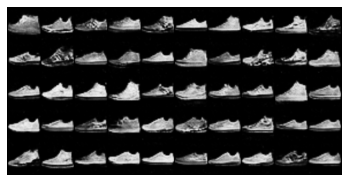

Epoch 83


Training...: 100%|██████████| 120/120 [00:03<00:00, 35.02it/s, Generator loss=4.62637, Discriminator loss=0.05298]


Avg batch loss for epoch 83: Generator: 4.27904 Discriminator: 0.11067 (Real: 0.05415 / Fake: 0.05652)


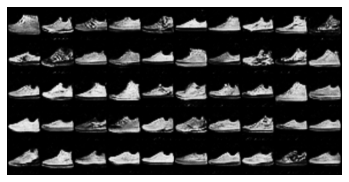

Epoch 84


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.27it/s, Generator loss=4.15195, Discriminator loss=0.05927]


Avg batch loss for epoch 84: Generator: 4.59245 Discriminator: 0.06593 (Real: 0.03276 / Fake: 0.03316)


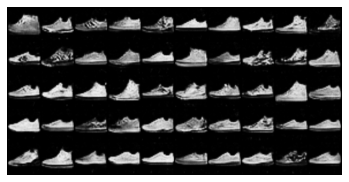

Epoch 85


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.55it/s, Generator loss=3.96445, Discriminator loss=0.05661]


Avg batch loss for epoch 85: Generator: 4.16479 Discriminator: 0.29246 (Real: 0.13715 / Fake: 0.15531)


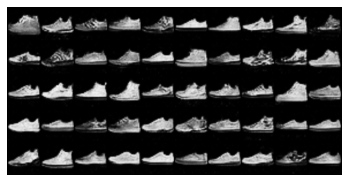

Epoch 86


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.34it/s, Generator loss=1.32497, Discriminator loss=0.85155]


Avg batch loss for epoch 86: Generator: 3.75909 Discriminator: 0.53881 (Real: 0.28246 / Fake: 0.25636)


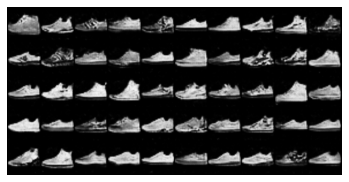

Epoch 87


Training...: 100%|██████████| 120/120 [00:03<00:00, 31.46it/s, Generator loss=4.56422, Discriminator loss=0.07732]


Avg batch loss for epoch 87: Generator: 3.76471 Discriminator: 0.41337 (Real: 0.20638 / Fake: 0.20700)


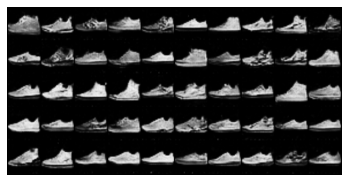

Epoch 88


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.96it/s, Generator loss=1.67936, Discriminator loss=1.04103]


Avg batch loss for epoch 88: Generator: 4.50846 Discriminator: 0.18656 (Real: 0.11108 / Fake: 0.07547)


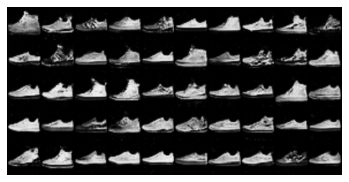

Epoch 89


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.77it/s, Generator loss=4.45112, Discriminator loss=0.11310]


Avg batch loss for epoch 89: Generator: 3.75362 Discriminator: 0.42392 (Real: 0.20977 / Fake: 0.21415)


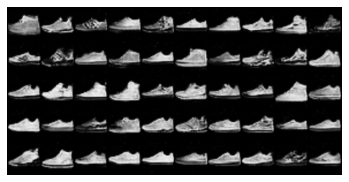

Epoch 90


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.75it/s, Generator loss=4.81585, Discriminator loss=0.02747]


Avg batch loss for epoch 90: Generator: 4.58588 Discriminator: 0.06525 (Real: 0.03258 / Fake: 0.03267)


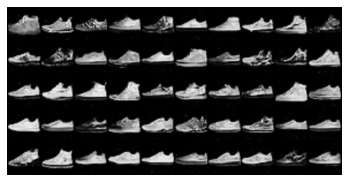

Epoch 91


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.36it/s, Generator loss=4.09328, Discriminator loss=0.07008]


Avg batch loss for epoch 91: Generator: 4.34891 Discriminator: 0.29009 (Real: 0.17273 / Fake: 0.11736)


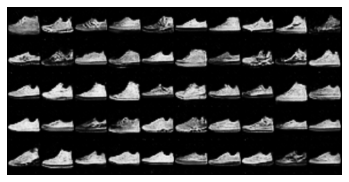

Epoch 92


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.81it/s, Generator loss=5.18117, Discriminator loss=0.04292]


Avg batch loss for epoch 92: Generator: 4.76757 Discriminator: 0.05554 (Real: 0.02734 / Fake: 0.02820)


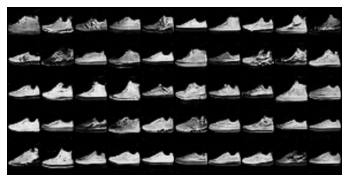

Epoch 93


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.30it/s, Generator loss=3.12466, Discriminator loss=0.57421]


Avg batch loss for epoch 93: Generator: 4.55438 Discriminator: 0.32499 (Real: 0.18816 / Fake: 0.13683)


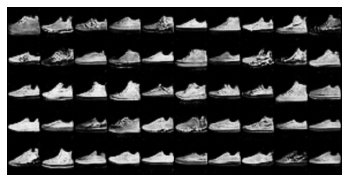

Epoch 94


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.53it/s, Generator loss=5.31459, Discriminator loss=0.51981]


Avg batch loss for epoch 94: Generator: 3.30806 Discriminator: 0.63167 (Real: 0.34064 / Fake: 0.29104)


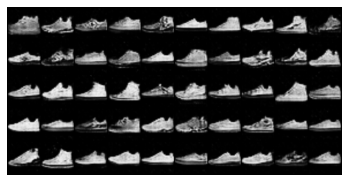

Epoch 95


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.83it/s, Generator loss=0.71142, Discriminator loss=1.26789]


Avg batch loss for epoch 95: Generator: 3.83852 Discriminator: 0.55744 (Real: 0.27781 / Fake: 0.27963)


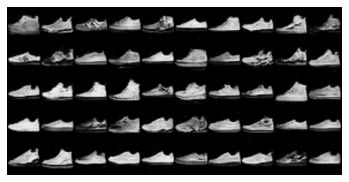

Epoch 96


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.00it/s, Generator loss=4.89912, Discriminator loss=0.13384]


Avg batch loss for epoch 96: Generator: 4.17335 Discriminator: 0.25921 (Real: 0.12505 / Fake: 0.13417)


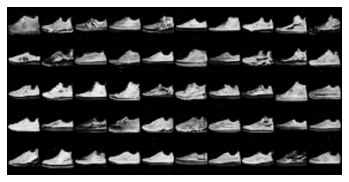

Epoch 97


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.69it/s, Generator loss=4.64919, Discriminator loss=0.04221]


Avg batch loss for epoch 97: Generator: 4.65778 Discriminator: 0.05608 (Real: 0.02827 / Fake: 0.02781)


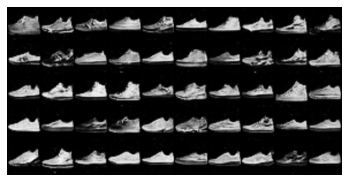

Epoch 98


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.51it/s, Generator loss=4.98275, Discriminator loss=0.02607]


Avg batch loss for epoch 98: Generator: 4.84938 Discriminator: 0.04281 (Real: 0.02138 / Fake: 0.02143)


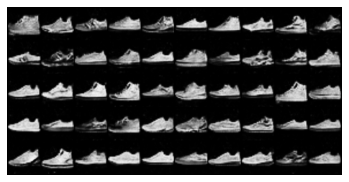

Epoch 99


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.54it/s, Generator loss=4.82011, Discriminator loss=0.07729]


Avg batch loss for epoch 99: Generator: 3.64728 Discriminator: 0.43543 (Real: 0.22842 / Fake: 0.20701)


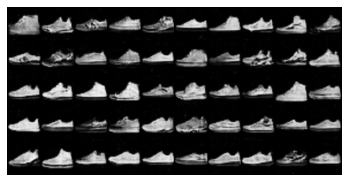

Epoch 100


Training...: 100%|██████████| 120/120 [00:06<00:00, 17.16it/s, Generator loss=1.52648, Discriminator loss=0.93840]


Avg batch loss for epoch 100: Generator: 4.05112 Discriminator: 0.52289 (Real: 0.29366 / Fake: 0.22923)


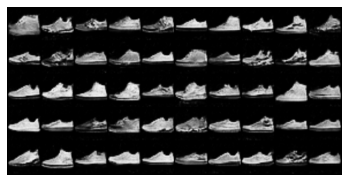

Epoch 101


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.18it/s, Generator loss=9.20988, Discriminator loss=2.62462]


Avg batch loss for epoch 101: Generator: 4.32832 Discriminator: 0.21039 (Real: 0.09532 / Fake: 0.11506)


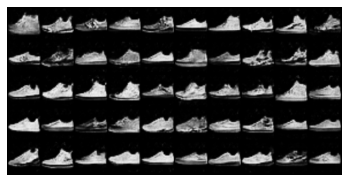

Epoch 102


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.37it/s, Generator loss=0.03023, Discriminator loss=3.65619]


Avg batch loss for epoch 102: Generator: 4.40564 Discriminator: 0.18344 (Real: 0.11349 / Fake: 0.06995)


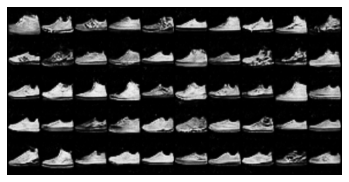

Epoch 103


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.59it/s, Generator loss=5.46281, Discriminator loss=1.32314]


Avg batch loss for epoch 103: Generator: 3.54140 Discriminator: 0.62116 (Real: 0.31104 / Fake: 0.31011)


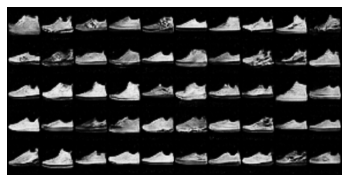

Epoch 104


Training...: 100%|██████████| 120/120 [00:06<00:00, 17.24it/s, Generator loss=5.76637, Discriminator loss=0.03704]


Avg batch loss for epoch 104: Generator: 4.48399 Discriminator: 0.15335 (Real: 0.07715 / Fake: 0.07620)


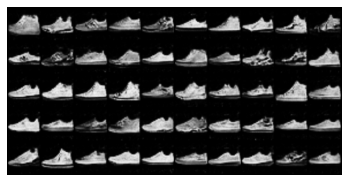

Epoch 105


Training...: 100%|██████████| 120/120 [00:07<00:00, 17.03it/s, Generator loss=5.31964, Discriminator loss=0.02007]


Avg batch loss for epoch 105: Generator: 4.95712 Discriminator: 0.04069 (Real: 0.02014 / Fake: 0.02055)


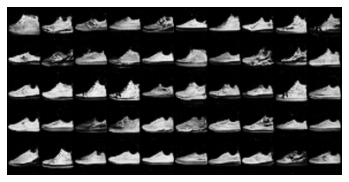

Epoch 106


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.65it/s, Generator loss=2.18083, Discriminator loss=1.20814]


Avg batch loss for epoch 106: Generator: 4.99923 Discriminator: 0.21609 (Real: 0.10085 / Fake: 0.11525)


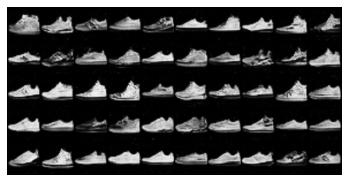

Epoch 107


Training...: 100%|██████████| 120/120 [00:05<00:00, 20.31it/s, Generator loss=3.45513, Discriminator loss=0.28727]


Avg batch loss for epoch 107: Generator: 3.37936 Discriminator: 0.50853 (Real: 0.27447 / Fake: 0.23406)


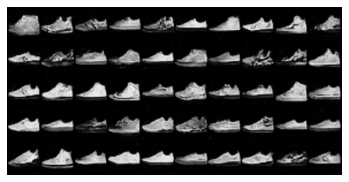

Epoch 108


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.62it/s, Generator loss=2.90653, Discriminator loss=0.24159]


Avg batch loss for epoch 108: Generator: 4.02624 Discriminator: 0.46878 (Real: 0.24581 / Fake: 0.22298)


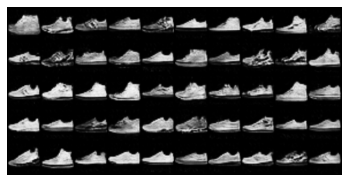

Epoch 109


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.52it/s, Generator loss=4.40994, Discriminator loss=0.04857]


Avg batch loss for epoch 109: Generator: 4.53736 Discriminator: 0.17090 (Real: 0.08475 / Fake: 0.08616)


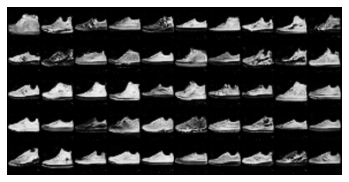

Epoch 110


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.56it/s, Generator loss=3.83497, Discriminator loss=0.07836]


Avg batch loss for epoch 110: Generator: 4.86841 Discriminator: 0.04758 (Real: 0.02385 / Fake: 0.02372)


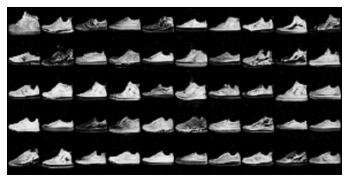

Epoch 111


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.42it/s, Generator loss=4.88857, Discriminator loss=0.03419]


Avg batch loss for epoch 111: Generator: 5.15667 Discriminator: 0.03974 (Real: 0.01971 / Fake: 0.02003)


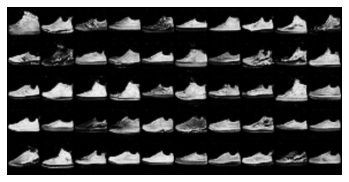

Epoch 112


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.06it/s, Generator loss=4.83486, Discriminator loss=0.13293]


Avg batch loss for epoch 112: Generator: 4.17748 Discriminator: 0.33836 (Real: 0.18107 / Fake: 0.15729)


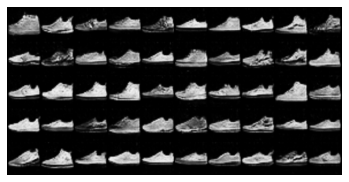

Epoch 113


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.12it/s, Generator loss=4.94029, Discriminator loss=0.11029]


Avg batch loss for epoch 113: Generator: 4.51188 Discriminator: 0.38973 (Real: 0.19539 / Fake: 0.19434)


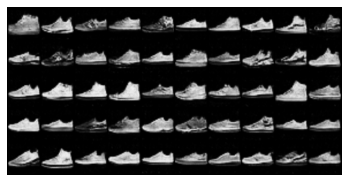

Epoch 114


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.16it/s, Generator loss=2.59937, Discriminator loss=0.28757] 


Avg batch loss for epoch 114: Generator: 4.47923 Discriminator: 0.32627 (Real: 0.18343 / Fake: 0.14284)


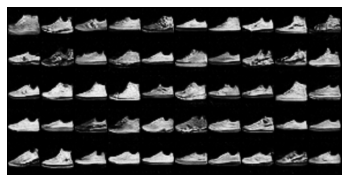

Epoch 115


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.57it/s, Generator loss=2.38714, Discriminator loss=0.53045]


Avg batch loss for epoch 115: Generator: 3.60087 Discriminator: 0.63199 (Real: 0.33415 / Fake: 0.29785)


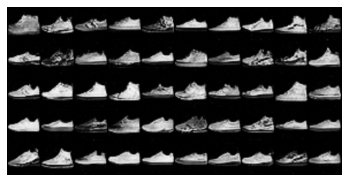

Epoch 116


Training...: 100%|██████████| 120/120 [00:06<00:00, 18.84it/s, Generator loss=3.40223, Discriminator loss=0.21498]


Avg batch loss for epoch 116: Generator: 4.09716 Discriminator: 0.22268 (Real: 0.11017 / Fake: 0.11252)


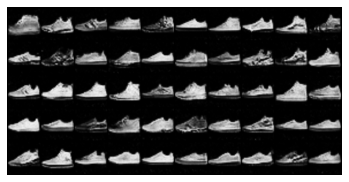

Epoch 117


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.93it/s, Generator loss=3.09487, Discriminator loss=0.33477]


Avg batch loss for epoch 117: Generator: 4.60843 Discriminator: 0.22131 (Real: 0.11985 / Fake: 0.10146)


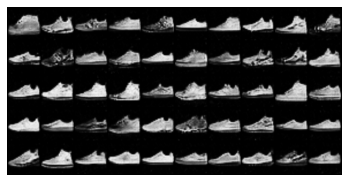

Epoch 118


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.82it/s, Generator loss=5.10686, Discriminator loss=0.02240]


Avg batch loss for epoch 118: Generator: 4.68843 Discriminator: 0.09482 (Real: 0.04606 / Fake: 0.04876)


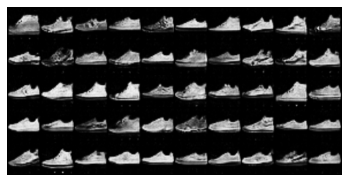

Epoch 119


Training...: 100%|██████████| 120/120 [00:07<00:00, 17.09it/s, Generator loss=5.01963, Discriminator loss=0.03509]


Avg batch loss for epoch 119: Generator: 5.27593 Discriminator: 0.03172 (Real: 0.01572 / Fake: 0.01600)


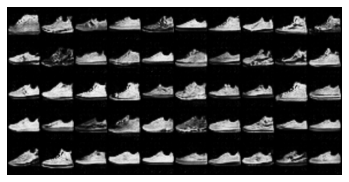

Epoch 120


Training...: 100%|██████████| 120/120 [00:06<00:00, 17.61it/s, Generator loss=6.05659, Discriminator loss=0.06170]


Avg batch loss for epoch 120: Generator: 5.39923 Discriminator: 0.02793 (Real: 0.01387 / Fake: 0.01406)


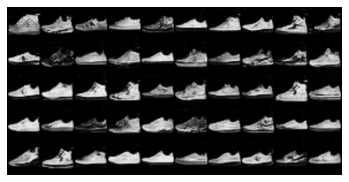

Epoch 121


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.94it/s, Generator loss=4.18486, Discriminator loss=0.91262]


Avg batch loss for epoch 121: Generator: 5.65078 Discriminator: 0.11001 (Real: 0.07026 / Fake: 0.03975)


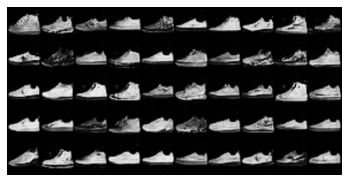

Epoch 122


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.76it/s, Generator loss=3.57229, Discriminator loss=0.27176]


Avg batch loss for epoch 122: Generator: 3.63568 Discriminator: 0.51525 (Real: 0.26722 / Fake: 0.24803)


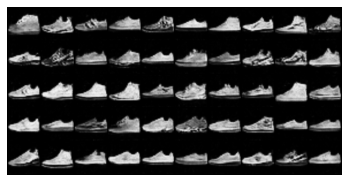

Epoch 123


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.00it/s, Generator loss=4.25959, Discriminator loss=0.18646]


Avg batch loss for epoch 123: Generator: 4.78702 Discriminator: 0.10757 (Real: 0.05297 / Fake: 0.05460)


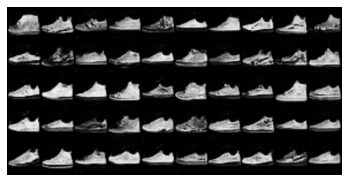

Epoch 124


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.66it/s, Generator loss=6.79567, Discriminator loss=0.20864]


Avg batch loss for epoch 124: Generator: 3.62021 Discriminator: 0.57462 (Real: 0.29903 / Fake: 0.27559)


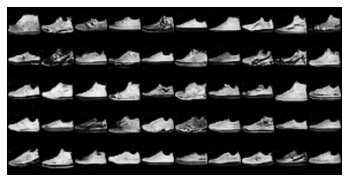

Epoch 125


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.86it/s, Generator loss=3.38054, Discriminator loss=0.26415] 


Avg batch loss for epoch 125: Generator: 4.54326 Discriminator: 0.23995 (Real: 0.12287 / Fake: 0.11708)


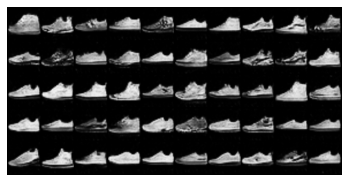

Epoch 126


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.37it/s, Generator loss=4.51727, Discriminator loss=0.05221]


Avg batch loss for epoch 126: Generator: 4.78148 Discriminator: 0.16087 (Real: 0.08216 / Fake: 0.07871)


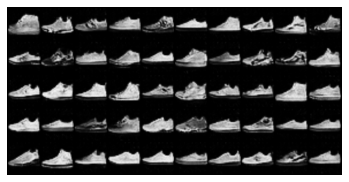

Epoch 127


Training...: 100%|██████████| 120/120 [00:06<00:00, 19.26it/s, Generator loss=4.82683, Discriminator loss=0.06219]


Avg batch loss for epoch 127: Generator: 4.54858 Discriminator: 0.27984 (Real: 0.16327 / Fake: 0.11658)


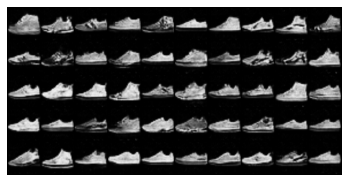

Epoch 128


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.65it/s, Generator loss=2.76233, Discriminator loss=0.48583]


Avg batch loss for epoch 128: Generator: 4.53862 Discriminator: 0.30167 (Real: 0.16370 / Fake: 0.13797)


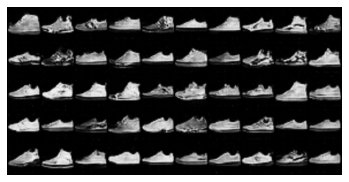

Epoch 129


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.59it/s, Generator loss=4.57284, Discriminator loss=0.03646]


Avg batch loss for epoch 129: Generator: 4.61718 Discriminator: 0.20625 (Real: 0.10811 / Fake: 0.09813)


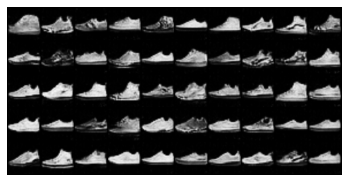

Epoch 130


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.42it/s, Generator loss=5.07017, Discriminator loss=0.02972]


Avg batch loss for epoch 130: Generator: 5.20047 Discriminator: 0.04029 (Real: 0.01995 / Fake: 0.02034)


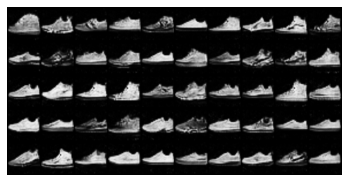

Epoch 131


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.04it/s, Generator loss=5.07555, Discriminator loss=0.04414]


Avg batch loss for epoch 131: Generator: 4.89554 Discriminator: 0.19132 (Real: 0.09381 / Fake: 0.09751)


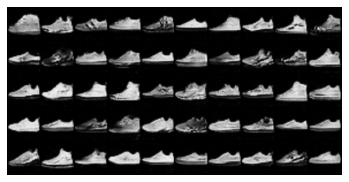

Epoch 132


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.21it/s, Generator loss=6.88877, Discriminator loss=0.01019]


Avg batch loss for epoch 132: Generator: 5.40579 Discriminator: 0.03516 (Real: 0.01727 / Fake: 0.01789)


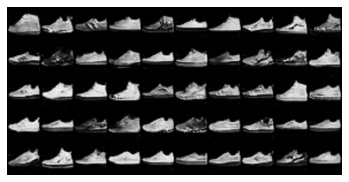

Epoch 133


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.34it/s, Generator loss=5.05112, Discriminator loss=0.03270]


Avg batch loss for epoch 133: Generator: 5.63416 Discriminator: 0.02498 (Real: 0.01250 / Fake: 0.01249)


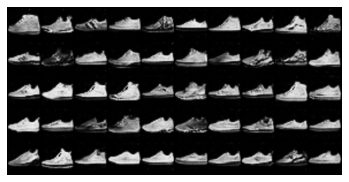

Epoch 134


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.23it/s, Generator loss=5.18898, Discriminator loss=0.01783]


Avg batch loss for epoch 134: Generator: 5.77931 Discriminator: 0.02073 (Real: 0.01032 / Fake: 0.01041)


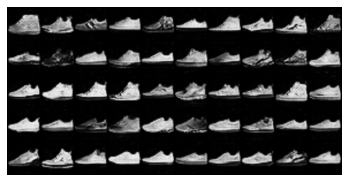

Epoch 135


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.25it/s, Generator loss=5.83926, Discriminator loss=0.02352]


Avg batch loss for epoch 135: Generator: 6.00849 Discriminator: 0.01833 (Real: 0.00906 / Fake: 0.00928)


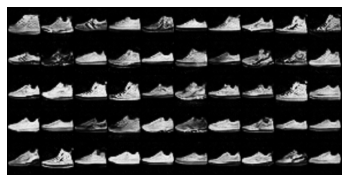

Epoch 136


Training...: 100%|██████████| 120/120 [00:03<00:00, 34.02it/s, Generator loss=5.45079, Discriminator loss=0.02307]


Avg batch loss for epoch 136: Generator: 6.06880 Discriminator: 0.01731 (Real: 0.00874 / Fake: 0.00858)


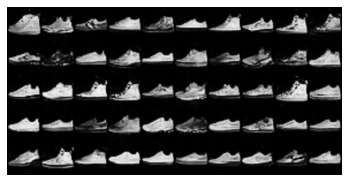

Epoch 137


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.61it/s, Generator loss=6.45910, Discriminator loss=0.02685]


Avg batch loss for epoch 137: Generator: 6.11788 Discriminator: 0.01457 (Real: 0.00720 / Fake: 0.00737)


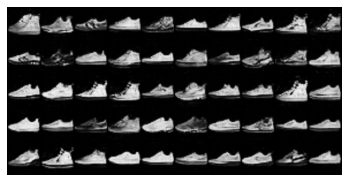

Epoch 138


Training...: 100%|██████████| 120/120 [00:03<00:00, 33.37it/s, Generator loss=2.98619, Discriminator loss=0.33848]


Avg batch loss for epoch 138: Generator: 4.03445 Discriminator: 0.53337 (Real: 0.28750 / Fake: 0.24587)


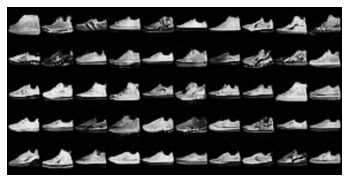

Epoch 139


Training...: 100%|██████████| 120/120 [00:03<00:00, 32.91it/s, Generator loss=3.83284, Discriminator loss=0.16299]


Avg batch loss for epoch 139: Generator: 4.38929 Discriminator: 0.47859 (Real: 0.24057 / Fake: 0.23802)


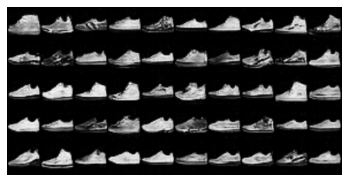

Epoch 140


Training...: 100%|██████████| 120/120 [00:04<00:00, 28.81it/s, Generator loss=6.05736, Discriminator loss=0.20714]


Avg batch loss for epoch 140: Generator: 4.40904 Discriminator: 0.34490 (Real: 0.17611 / Fake: 0.16879)


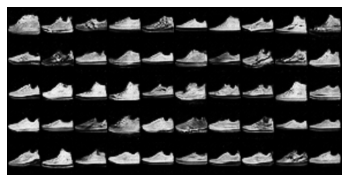

Epoch 141


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.26it/s, Generator loss=4.30819, Discriminator loss=0.17637]


Avg batch loss for epoch 141: Generator: 4.38948 Discriminator: 0.29666 (Real: 0.15670 / Fake: 0.13997)


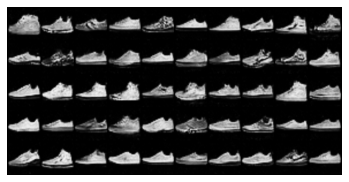

Epoch 142


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.23it/s, Generator loss=4.98884, Discriminator loss=0.31460]


Avg batch loss for epoch 142: Generator: 4.10831 Discriminator: 0.52405 (Real: 0.26702 / Fake: 0.25704)


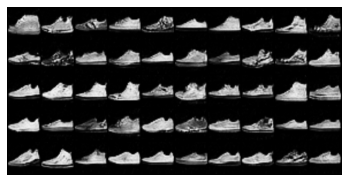

Epoch 143


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.59it/s, Generator loss=4.21435, Discriminator loss=0.18877] 


Avg batch loss for epoch 143: Generator: 4.23218 Discriminator: 0.35890 (Real: 0.18369 / Fake: 0.17521)


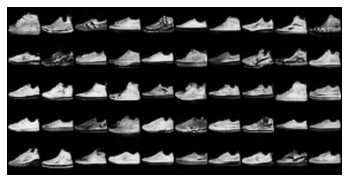

Epoch 144


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.74it/s, Generator loss=5.89011, Discriminator loss=0.02106]


Avg batch loss for epoch 144: Generator: 4.56766 Discriminator: 0.20961 (Real: 0.10669 / Fake: 0.10292)


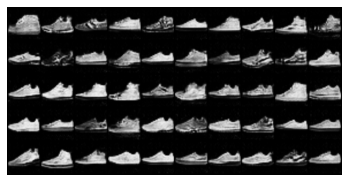

Epoch 145


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.60it/s, Generator loss=5.19392, Discriminator loss=0.01968]


Avg batch loss for epoch 145: Generator: 5.42708 Discriminator: 0.03471 (Real: 0.01717 / Fake: 0.01755)


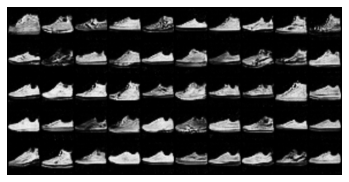

Epoch 146


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.69it/s, Generator loss=5.03758, Discriminator loss=0.03215]


Avg batch loss for epoch 146: Generator: 5.46966 Discriminator: 0.02841 (Real: 0.01387 / Fake: 0.01454)


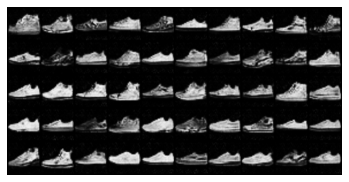

Epoch 147


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.68it/s, Generator loss=4.36754, Discriminator loss=0.16916]


Avg batch loss for epoch 147: Generator: 4.75237 Discriminator: 0.16896 (Real: 0.08947 / Fake: 0.07949)


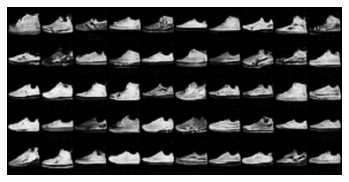

Epoch 148


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.45it/s, Generator loss=3.39741, Discriminator loss=0.50868]


Avg batch loss for epoch 148: Generator: 4.15210 Discriminator: 0.43369 (Real: 0.21850 / Fake: 0.21519)


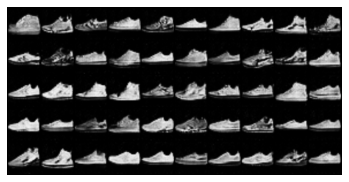

Epoch 149


Training...: 100%|██████████| 120/120 [00:07<00:00, 17.03it/s, Generator loss=5.23269, Discriminator loss=0.02242]


Avg batch loss for epoch 149: Generator: 4.99315 Discriminator: 0.10480 (Real: 0.05140 / Fake: 0.05340)


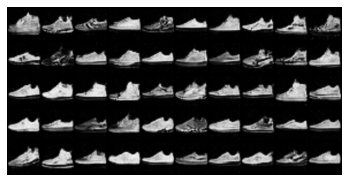

Epoch 150


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.76it/s, Generator loss=5.31605, Discriminator loss=0.04833]


Avg batch loss for epoch 150: Generator: 4.87327 Discriminator: 0.17689 (Real: 0.09657 / Fake: 0.08033)


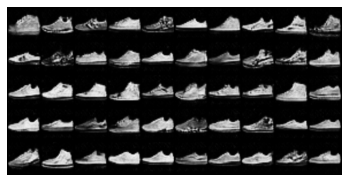

Epoch 151


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.17it/s, Generator loss=4.54923, Discriminator loss=0.10277] 


Avg batch loss for epoch 151: Generator: 4.26842 Discriminator: 0.47865 (Real: 0.26911 / Fake: 0.20954)


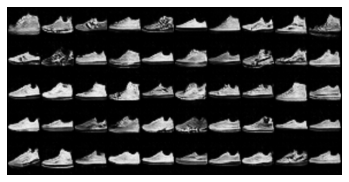

Epoch 152


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.60it/s, Generator loss=5.26744, Discriminator loss=0.04353]


Avg batch loss for epoch 152: Generator: 4.68247 Discriminator: 0.20851 (Real: 0.10659 / Fake: 0.10191)


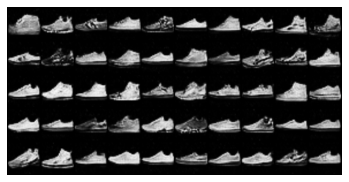

Epoch 153


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.66it/s, Generator loss=4.82371, Discriminator loss=0.03801]


Avg batch loss for epoch 153: Generator: 5.47028 Discriminator: 0.02780 (Real: 0.01369 / Fake: 0.01411)


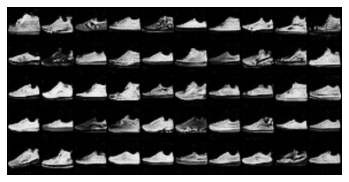

Epoch 154


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.28it/s, Generator loss=5.71228, Discriminator loss=0.11510]


Avg batch loss for epoch 154: Generator: 4.49854 Discriminator: 0.24329 (Real: 0.12845 / Fake: 0.11484)


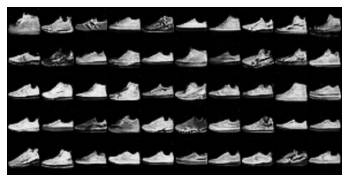

Epoch 155


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.51it/s, Generator loss=6.11682, Discriminator loss=0.01123]


Avg batch loss for epoch 155: Generator: 5.45033 Discriminator: 0.03454 (Real: 0.01698 / Fake: 0.01756)


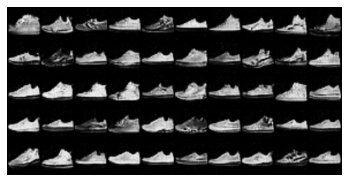

Epoch 156


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.81it/s, Generator loss=3.04583, Discriminator loss=0.22415]


Avg batch loss for epoch 156: Generator: 3.52323 Discriminator: 0.58222 (Real: 0.30478 / Fake: 0.27744)


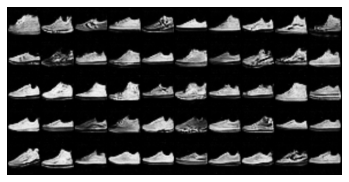

Epoch 157


Training...: 100%|██████████| 120/120 [00:06<00:00, 17.33it/s, Generator loss=6.09621, Discriminator loss=0.06214]


Avg batch loss for epoch 157: Generator: 4.47467 Discriminator: 0.15217 (Real: 0.07453 / Fake: 0.07764)


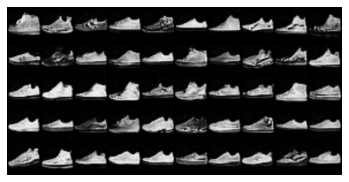

Epoch 158


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.08it/s, Generator loss=4.63666, Discriminator loss=0.06643]


Avg batch loss for epoch 158: Generator: 3.93041 Discriminator: 0.48035 (Real: 0.24329 / Fake: 0.23706)


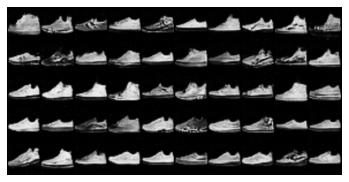

Epoch 159


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.20it/s, Generator loss=5.29189, Discriminator loss=0.03789]


Avg batch loss for epoch 159: Generator: 5.22225 Discriminator: 0.04629 (Real: 0.02247 / Fake: 0.02382)


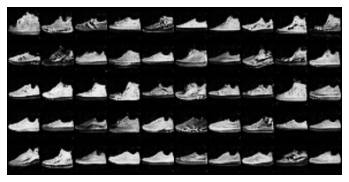

Epoch 160


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.49it/s, Generator loss=5.21465, Discriminator loss=0.02523]


Avg batch loss for epoch 160: Generator: 5.70537 Discriminator: 0.02334 (Real: 0.01165 / Fake: 0.01169)


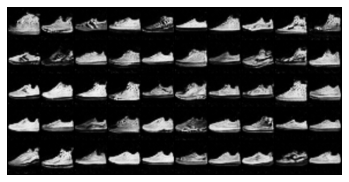

Epoch 161


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.54it/s, Generator loss=5.77952, Discriminator loss=0.01448]


Avg batch loss for epoch 161: Generator: 6.16267 Discriminator: 0.02332 (Real: 0.01155 / Fake: 0.01177)


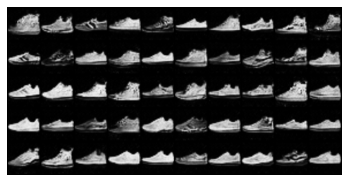

Epoch 162


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.07it/s, Generator loss=3.63381, Discriminator loss=0.22937]


Avg batch loss for epoch 162: Generator: 4.96375 Discriminator: 0.15436 (Real: 0.08657 / Fake: 0.06780)


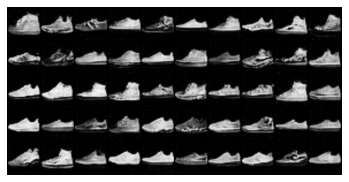

Epoch 163


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.69it/s, Generator loss=5.54471, Discriminator loss=0.24172]


Avg batch loss for epoch 163: Generator: 4.67068 Discriminator: 0.28855 (Real: 0.14740 / Fake: 0.14115)


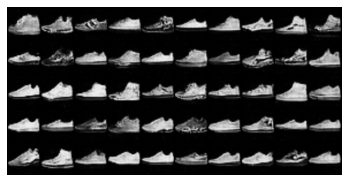

Epoch 164


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.67it/s, Generator loss=5.20829, Discriminator loss=0.02087]


Avg batch loss for epoch 164: Generator: 5.48811 Discriminator: 0.05282 (Real: 0.02623 / Fake: 0.02659)


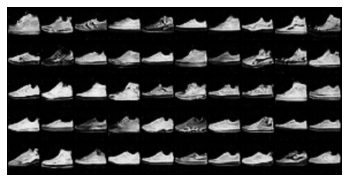

Epoch 165


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.80it/s, Generator loss=5.63977, Discriminator loss=0.01232]


Avg batch loss for epoch 165: Generator: 5.85780 Discriminator: 0.02189 (Real: 0.01084 / Fake: 0.01105)


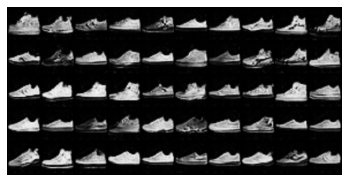

Epoch 166


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.65it/s, Generator loss=4.17556, Discriminator loss=0.41084]


Avg batch loss for epoch 166: Generator: 4.96116 Discriminator: 0.38371 (Real: 0.20291 / Fake: 0.18080)


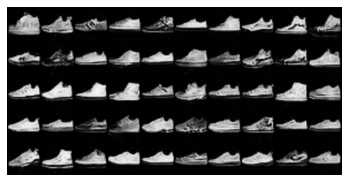

Epoch 167


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.26it/s, Generator loss=4.34358, Discriminator loss=0.23074] 


Avg batch loss for epoch 167: Generator: 3.87873 Discriminator: 0.38057 (Real: 0.19289 / Fake: 0.18768)


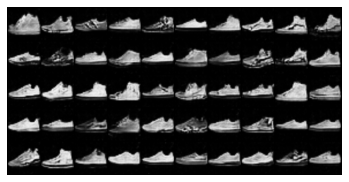

Epoch 168


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.36it/s, Generator loss=3.33575, Discriminator loss=0.27412] 


Avg batch loss for epoch 168: Generator: 4.07381 Discriminator: 0.42243 (Real: 0.21276 / Fake: 0.20967)


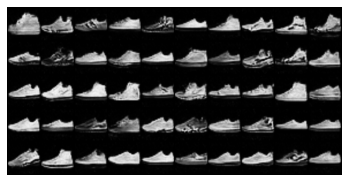

Epoch 169


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.95it/s, Generator loss=2.66404, Discriminator loss=0.29948]


Avg batch loss for epoch 169: Generator: 4.36378 Discriminator: 0.31899 (Real: 0.15743 / Fake: 0.16157)


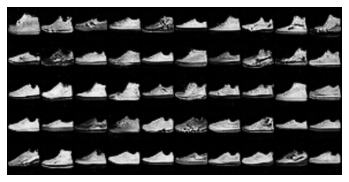

Epoch 170


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.25it/s, Generator loss=4.41639, Discriminator loss=0.07324] 


Avg batch loss for epoch 170: Generator: 4.63116 Discriminator: 0.18371 (Real: 0.08936 / Fake: 0.09435)


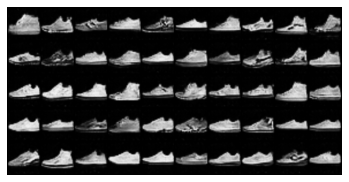

Epoch 171


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.65it/s, Generator loss=5.41360, Discriminator loss=0.01399]


Avg batch loss for epoch 171: Generator: 5.40020 Discriminator: 0.03838 (Real: 0.01903 / Fake: 0.01935)


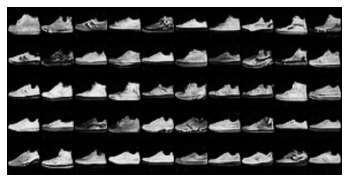

Epoch 172


Training...: 100%|██████████| 120/120 [00:07<00:00, 15.88it/s, Generator loss=7.90668, Discriminator loss=0.02144]


Avg batch loss for epoch 172: Generator: 5.78388 Discriminator: 0.02458 (Real: 0.01225 / Fake: 0.01232)


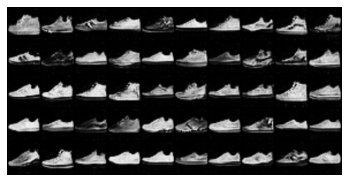

Epoch 173


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.12it/s, Generator loss=3.27317, Discriminator loss=0.13652] 


Avg batch loss for epoch 173: Generator: 5.64623 Discriminator: 0.13215 (Real: 0.07600 / Fake: 0.05615)


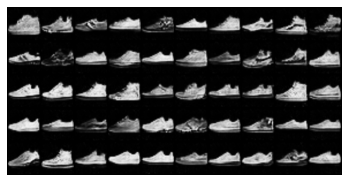

Epoch 174


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.12it/s, Generator loss=6.98385, Discriminator loss=0.11291]


Avg batch loss for epoch 174: Generator: 4.77875 Discriminator: 0.15659 (Real: 0.07736 / Fake: 0.07923)


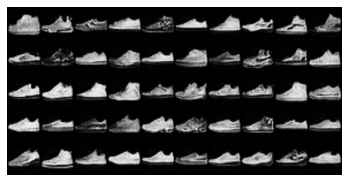

Epoch 175


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.90it/s, Generator loss=6.27080, Discriminator loss=0.00639]


Avg batch loss for epoch 175: Generator: 5.81654 Discriminator: 0.02576 (Real: 0.01280 / Fake: 0.01296)


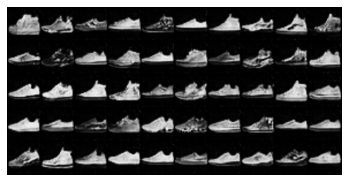

Epoch 176


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.54it/s, Generator loss=5.80676, Discriminator loss=0.01288]


Avg batch loss for epoch 176: Generator: 6.01527 Discriminator: 0.01892 (Real: 0.00946 / Fake: 0.00946)


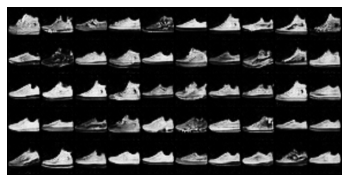

Epoch 177


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.43it/s, Generator loss=2.71973, Discriminator loss=0.25843] 


Avg batch loss for epoch 177: Generator: 5.43564 Discriminator: 0.29610 (Real: 0.16855 / Fake: 0.12755)


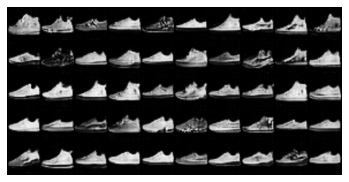

Epoch 178


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.17it/s, Generator loss=3.40476, Discriminator loss=0.19758]


Avg batch loss for epoch 178: Generator: 4.09032 Discriminator: 0.33927 (Real: 0.17318 / Fake: 0.16609)


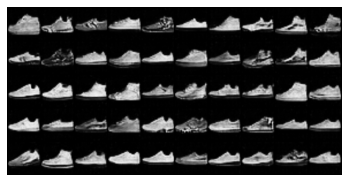

Epoch 179


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.53it/s, Generator loss=4.98405, Discriminator loss=0.05910]


Avg batch loss for epoch 179: Generator: 4.87148 Discriminator: 0.24963 (Real: 0.12747 / Fake: 0.12216)


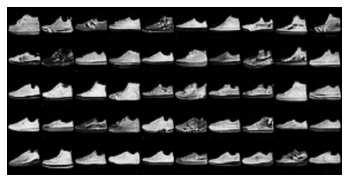

Epoch 180


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.25it/s, Generator loss=4.61416, Discriminator loss=0.31382]


Avg batch loss for epoch 180: Generator: 4.47287 Discriminator: 0.40903 (Real: 0.21557 / Fake: 0.19346)


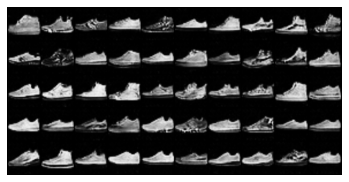

Epoch 181


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.23it/s, Generator loss=5.88409, Discriminator loss=0.14331]


Avg batch loss for epoch 181: Generator: 4.62440 Discriminator: 0.19876 (Real: 0.10521 / Fake: 0.09355)


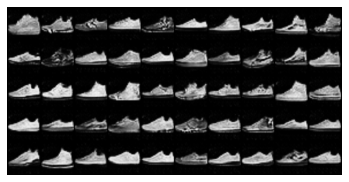

Epoch 182


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.69it/s, Generator loss=5.19536, Discriminator loss=0.02334]


Avg batch loss for epoch 182: Generator: 5.61440 Discriminator: 0.02566 (Real: 0.01282 / Fake: 0.01284)


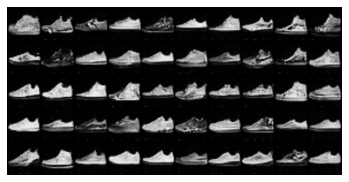

Epoch 183


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.53it/s, Generator loss=5.26233, Discriminator loss=0.04771]


Avg batch loss for epoch 183: Generator: 5.85210 Discriminator: 0.02084 (Real: 0.01038 / Fake: 0.01046)


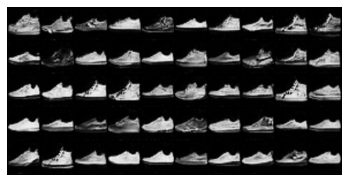

Epoch 184


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.63it/s, Generator loss=1.82212, Discriminator loss=3.02714]


Avg batch loss for epoch 184: Generator: 4.57556 Discriminator: 0.29339 (Real: 0.18089 / Fake: 0.11250)


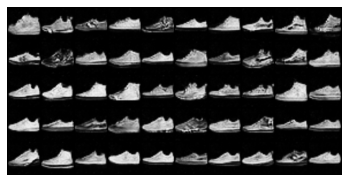

Epoch 185


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.68it/s, Generator loss=5.41452, Discriminator loss=0.23241] 


Avg batch loss for epoch 185: Generator: 4.67481 Discriminator: 0.36071 (Real: 0.20510 / Fake: 0.15561)


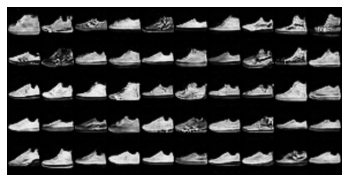

Epoch 186


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.37it/s, Generator loss=2.63632, Discriminator loss=0.38245]


Avg batch loss for epoch 186: Generator: 4.11597 Discriminator: 0.33472 (Real: 0.16924 / Fake: 0.16547)


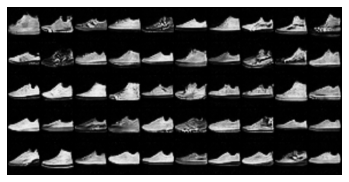

Epoch 187


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.23it/s, Generator loss=5.16952, Discriminator loss=0.05230]


Avg batch loss for epoch 187: Generator: 4.57200 Discriminator: 0.18034 (Real: 0.08979 / Fake: 0.09055)


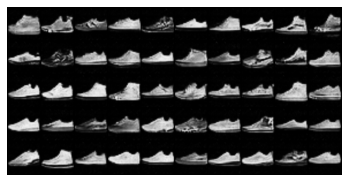

Epoch 188


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.33it/s, Generator loss=6.64397, Discriminator loss=0.01996]


Avg batch loss for epoch 188: Generator: 5.60016 Discriminator: 0.02732 (Real: 0.01323 / Fake: 0.01409)


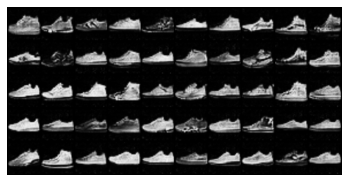

Epoch 189


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.57it/s, Generator loss=6.34051, Discriminator loss=0.01121]


Avg batch loss for epoch 189: Generator: 5.88820 Discriminator: 0.02234 (Real: 0.01105 / Fake: 0.01129)


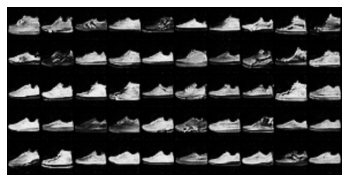

Epoch 190


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.33it/s, Generator loss=4.60192, Discriminator loss=0.14261] 


Avg batch loss for epoch 190: Generator: 5.65557 Discriminator: 0.18378 (Real: 0.10544 / Fake: 0.07834)


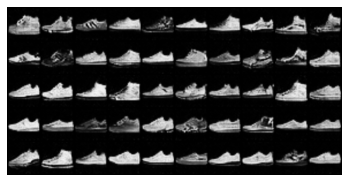

Epoch 191


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.26it/s, Generator loss=6.30573, Discriminator loss=0.00836]


Avg batch loss for epoch 191: Generator: 5.14776 Discriminator: 0.07973 (Real: 0.04099 / Fake: 0.03874)


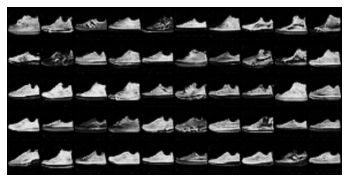

Epoch 192


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.00it/s, Generator loss=5.96984, Discriminator loss=0.00958]


Avg batch loss for epoch 192: Generator: 5.91768 Discriminator: 0.02050 (Real: 0.01014 / Fake: 0.01037)


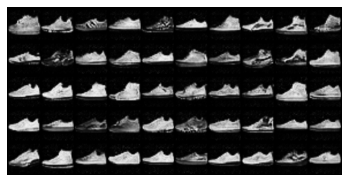

Epoch 193


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.52it/s, Generator loss=8.80730, Discriminator loss=0.00317]


Avg batch loss for epoch 193: Generator: 6.19311 Discriminator: 0.01414 (Real: 0.00687 / Fake: 0.00728)


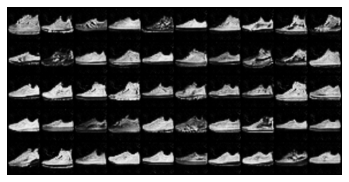

Epoch 194


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.78it/s, Generator loss=5.46578, Discriminator loss=0.40961]


Avg batch loss for epoch 194: Generator: 6.27553 Discriminator: 0.13993 (Real: 0.08386 / Fake: 0.05608)


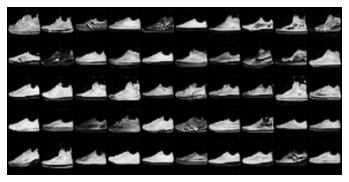

Epoch 195


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.31it/s, Generator loss=6.22691, Discriminator loss=0.36099]


Avg batch loss for epoch 195: Generator: 4.46862 Discriminator: 0.19355 (Real: 0.09631 / Fake: 0.09725)


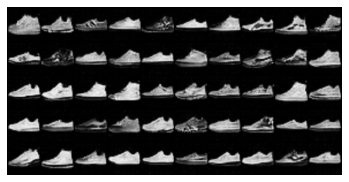

Epoch 196


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.60it/s, Generator loss=6.16017, Discriminator loss=0.02083]


Avg batch loss for epoch 196: Generator: 4.98417 Discriminator: 0.32212 (Real: 0.16498 / Fake: 0.15714)


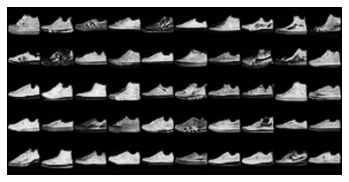

Epoch 197


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.30it/s, Generator loss=5.39903, Discriminator loss=0.09060] 


Avg batch loss for epoch 197: Generator: 4.51143 Discriminator: 0.39945 (Real: 0.21419 / Fake: 0.18526)


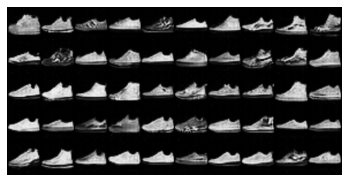

Epoch 198


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.90it/s, Generator loss=4.68568, Discriminator loss=0.70361]


Avg batch loss for epoch 198: Generator: 4.50812 Discriminator: 0.34133 (Real: 0.17798 / Fake: 0.16334)


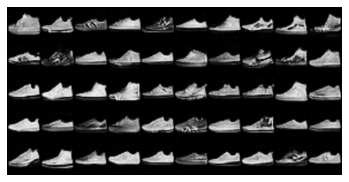

Epoch 199


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.45it/s, Generator loss=4.96063, Discriminator loss=0.05773]


Avg batch loss for epoch 199: Generator: 4.74888 Discriminator: 0.14690 (Real: 0.07240 / Fake: 0.07450)


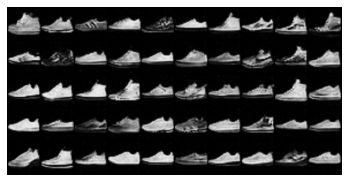

Epoch 200


Training...: 100%|██████████| 120/120 [00:07<00:00, 16.57it/s, Generator loss=5.54279, Discriminator loss=0.01843]


Avg batch loss for epoch 200: Generator: 5.75074 Discriminator: 0.02587 (Real: 0.01254 / Fake: 0.01333)


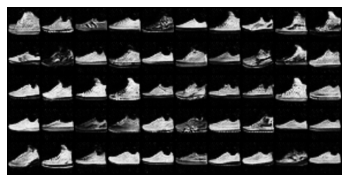

In [14]:
# fix number of epochs
EPOCHS = 200

# initialize loss trackers
av_batch_loss_gen = []
av_batch_loss_dis = []
av_batch_loss_dis_real = []
av_batch_loss_dis_fake = []

# initialize discriminator output trackers
D_real = []
D_fake = []

# training loop
for epoch in range(EPOCHS):
    
    batch_loss_gen = []
    batch_loss_dis = []
    batch_loss_dis_real = []
    batch_loss_dis_fake = []
    
    print(f'Epoch {epoch+1}')
    p_bar = tqdm(train_dataloader, total=len(train_dataloader), desc="Training...")
    
    for batch in p_bar:
        
        ################################################
        ## UPDATE DISCRIMINATOR                       ##
        ## maximize  log(D(x)) + log(1 - D(G(z))) via ##
        ## minimize -log(D(x)) - log(1 - D(G(z)))     ##
        ################################################

        # train discriminator with batch of real images
        modelDis.zero_grad()
        # rescale image values from [0,1] to [-1,1]
        real_images = batch[0].to(device) *2. - 1.
        #print(real_images.size())
        # feed real images into discriminator
        output_dis = modelDis(real_images).view(-1)
        #print(modelDis(real_images).size())
        # calculate loss on batch of real images, labels are used to select -log(D(x)) part of BCELoss()
        lossD_real = criterion(output_dis,real_labels)        
        # calculate gradients for discriminator in backward pass
        lossD_real.backward()
            
        # averaged discriminator output for real images            
        D_x = output_dis.mean().item()
        
        # train discriminator with batch of fake images
        # generate batch of latent vectors
        z = torch.randn((BATCH_SIZE, LATENT_DIM)).view(-1,LATENT_DIM,1,1).to(device)        
        # generate fake image batch with generator
        fake_images = modelGen(z)
        # feed fake images into discriminator, .detach() required here since the generator gradients 
        # should not be calculated/updated at this point
        output_dis = modelDis(fake_images.detach()).view(-1)
        # calculate loss on batch of fake images, labels are used to select -log(1-D(G(z))) part of BCELoss()
        lossD_fake = criterion(output_dis,fake_labels)
        # calculate gradients for discriminator in backward pass, accumulated with previous gradients
        lossD_fake.backward()
        
        # averaged discriminator output for fake images
        D_G_z1 = output_dis.mean().item()
        
        # compute loss of dicrimintor as sum over fake and real images
        lossD = lossD_real + lossD_fake
        
        # update discriminator
        optimizerDis.step()
        
        ################################################################
        ## UPDATE GENERATOR                                           ##
        ## maximize log(D(G(z))) INSTEAD of minimize log(1 - D(G(z))) ##
        ## via minimize -log(D(G(z)))                                 ##
        ################################################################
        
        # train generator with fake images
        modelGen.zero_grad()
        # feed fake images into the just updated discriminator
        output_dis = modelDis(fake_images).view(-1)
        # calculate loss on batch of fake images, labels are used to select -log(D(G(z))) part of BCELoss()
        lossG = criterion(output_dis, real_labels)
        # calculate gradients for generator in backward pass (also for discriminator, but not used)
        lossG.backward()
        
        # averaged output of updated descriminator for fake images
        D_G_z2 = output_dis.mean().item()
        
        # update generator
        optimizerGen.step()
        
        # track batch losses
        batch_loss_dis.append(lossD.item())
        batch_loss_dis_real.append(lossD_real.item())
        batch_loss_dis_fake.append(lossD_fake.item())
        batch_loss_gen.append(lossG.item())
        
        # track discriminator output for real and fake images (averaged per batch)
        D_real.append(D_x)
        D_fake.append(D_G_z2)
      
        p_bar.set_postfix({'Generator loss': f'{lossG.item():.5f}','Discriminator loss': f'{lossD.item():.5f}'})
        p_bar.update()

    # track average batch losses
    av_batch_loss_gen.append(np.mean(batch_loss_gen))
    av_batch_loss_dis.append(np.mean(batch_loss_dis))
    av_batch_loss_dis_real.append(np.mean(batch_loss_dis_real))
    av_batch_loss_dis_fake.append(np.mean(batch_loss_dis_fake))
    
    print(f'Avg batch loss for epoch {epoch+1}: Generator: {np.mean(batch_loss_gen):.5f} Discriminator: {np.mean(batch_loss_dis):.5f} (Real: {np.mean(batch_loss_dis_real):.5f} / Fake: {np.mean(batch_loss_dis_fake):.5f})')
    
    # generate batch of images with generator, renormalize output from range [-1,1] to [0,1]
    fake_images_val = (modelGen(z_val) + 1) / 2
    fake_images_val = fake_images_val.to('cpu').detach()
    grid_img = make_grid(fake_images_val, nrow=10)
    plt.imshow(grid_img.permute(1,2,0))
    plt.axis('off')
    plt.show()    

## Training illustrations

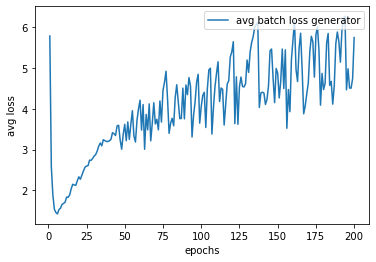

<Figure size 432x288 with 0 Axes>

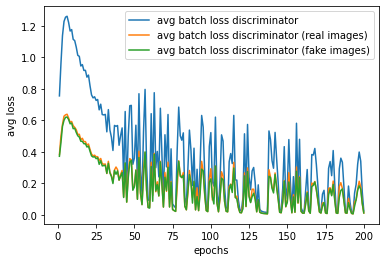

<Figure size 432x288 with 0 Axes>

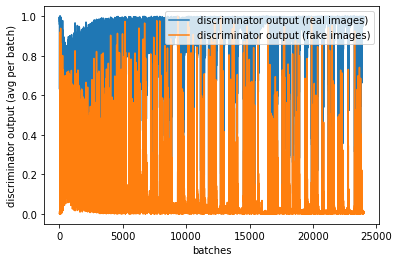

<Figure size 432x288 with 0 Axes>

In [15]:
# plot average batch loss of generator
def plot_loss_gen(av_batch_loss):
    axes = plt.figure().gca() 
    axes.xaxis.get_major_locator().set_params(integer=True) 
    plt.xlabel("epochs")
    plt.ylabel("avg loss")
    plt.plot(np.arange(len(av_batch_loss))+1, av_batch_loss)
    plt.legend(['avg batch loss generator'], loc='upper right')
    plt.show()
    plt.clf() 

plot_loss_gen(av_batch_loss_gen)

# plot average batch loss of discriminator
def plot_loss_dis(av_batch_loss,av_batch_loss_real,av_batch_loss_fake):
    axes = plt.figure().gca() 
    axes.xaxis.get_major_locator().set_params(integer=True) 
    plt.xlabel("epochs")
    plt.ylabel("avg loss")
    plt.plot(np.arange(len(av_batch_loss))+1, av_batch_loss)
    plt.plot(np.arange(len(av_batch_loss_real))+1, av_batch_loss_real)
    plt.plot(np.arange(len(av_batch_loss_fake))+1, av_batch_loss_fake)
    plt.legend(['avg batch loss discriminator', 'avg batch loss discriminator (real images)', 'avg batch loss discriminator (fake images)'], loc='upper right')
    plt.show()
    plt.clf() 
    
plot_loss_dis(av_batch_loss_dis,av_batch_loss_dis_real,av_batch_loss_dis_fake)

# plot discriminator output for real and fake images (averaged per batch)
def plot_dis_output(D_real,D_fake):
    axes = plt.figure().gca() 
    axes.xaxis.get_major_locator().set_params(integer=True) 
    plt.xlabel("batches")
    plt.ylabel("discriminator output (avg per batch)")
    plt.plot(np.arange(len(D_real))+1, D_real)
    plt.plot(np.arange(len(D_fake))+1, D_fake)
    plt.legend(['discriminator output (real images)', 'discriminator output (fake images)'], loc='upper right')
    plt.show()
    plt.clf() 
    
plot_dis_output(D_real,D_fake)    

## Generate fake images with trained generator, test trained discriminator with fake images

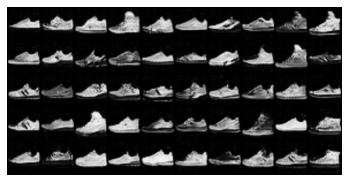

In [16]:
# generate batch of images with trained generator, renormalize output from range [-1,1] to [0,1]
#modelGen.to('cpu')
z_test = torch.randn((BATCH_SIZE, LATENT_DIM)).view(-1,LATENT_DIM,1,1).to(device)
fake_images_test = (modelGen(z_test) + 1) / 2
fake_images_test = fake_images_test.to('cpu').detach()
grid_img = make_grid(fake_images_test, nrow=10)
plt.imshow(grid_img.permute(1,2,0))
plt.axis('off')
plt.show()  

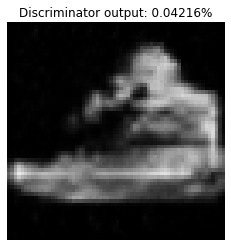

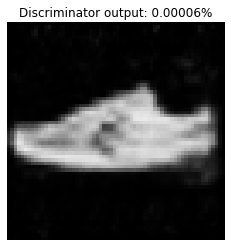

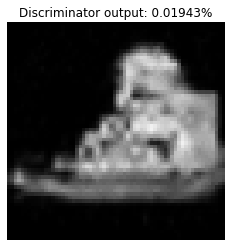

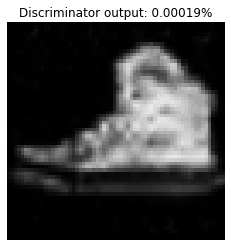

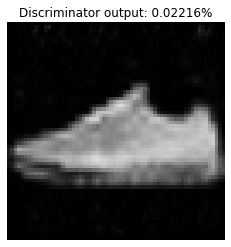

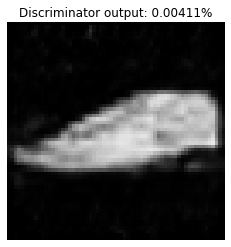

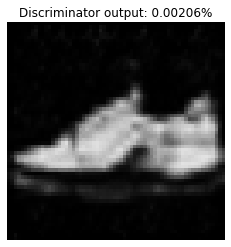

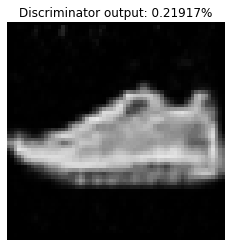

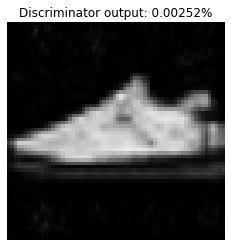

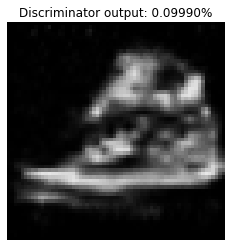

In [17]:
modelGen.to('cpu')
modelDis.to('cpu')
for i in range(10):
    z = torch.randn((LATENT_DIM)).view(-1,LATENT_DIM,1,1).to('cpu')
    test_image_t =  modelGen(z) 
    test_image = test_image_t.to('cpu').detach().numpy()
    plt.imshow(test_image.reshape(64,64),cmap='gray', vmin=-1, vmax=1)
    output_dis = modelDis(test_image_t)
    title_prob = f'Discriminator output: {output_dis.item()*100:.5f}%'
    plt.title(title_prob)
    plt.axis('off')
    plt.show()

## Test discriminator with real images

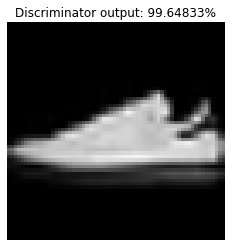

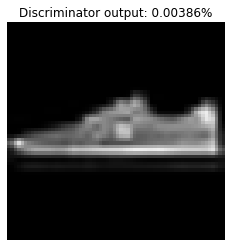

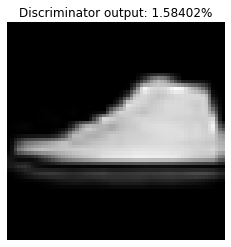

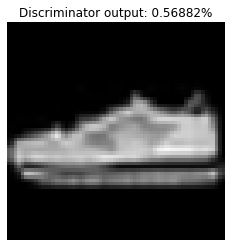

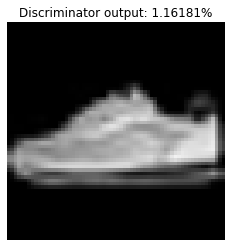

...

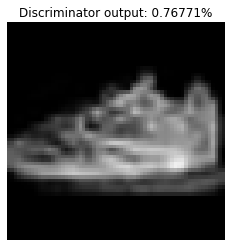

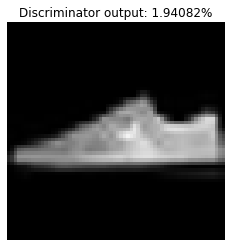

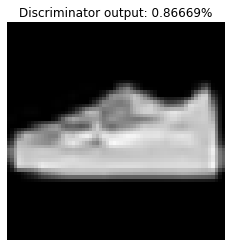

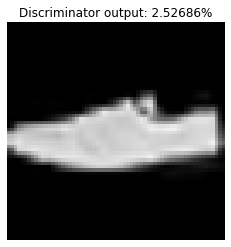

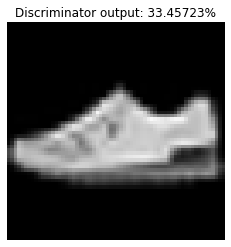

In [18]:
for i, data in enumerate(train_subset):
    if i > 10:
        break
    test_image = data[0].to('cpu').detach().numpy()
    plt.imshow(test_image.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap='gray', vmin=0, vmax=1)
    label = modelDis(data[0].reshape(1,1,IMAGE_SIZE,IMAGE_SIZE)*2.-1.)
    title_prob = f'Discriminator output: {label.item()*100:.5f}%'
    plt.title(title_prob)
    plt.axis('off')
    plt.show()

## Save models of generator / discriminator

In [19]:
torch.save(modelGen.cpu(), 'modelGen_sneaker_latent100_channel1024_e15.pth')
torch.save(modelDis.cpu(), 'modelDis_sneaker_latent100_channel1024_e15.pth')